<h1 style='text-align:center'><b>Improving the Number of Review: Exploring Review Patterns in Bangkok's Airbnb Landscape</b></h1>

## <b>1 Introduction</b>
<b>About Airbnb Thailand</b>: [Airbnb, Inc](https://www.airbnb.com)., is an American-based marketplace for  online booking and tourism experience operates globally offering lodging rentals and leisure travel services in more than 220 countries. This company seeks to strengthen its position in Bangkok market amidst the [increasing number of travelers](https://www.bbc.com/news/business-64369279) visiting Thailand, particularly after COVID-19 pandemic.

<b>Problem Statement</b>: Airbnb Thailand has identified that approximately 36% (or 5.7 thousand) of listings in Bangkok have not received any reviews between 2012 and 2022. This raises concerns about possibilities of
- listings being inactive or not actively rented out, resulting in no reviews
- less popular among guests, leading to fewer bookings and no reviews
- newly added listings so no guests have reviewed them yet
- limited availability issue, reducing customers' opportunities to stay and leave reviews.

To address this issue, thee Host Engagement team seeks to understand the underlying factors contributing to the lack of reeviews and identify actionable insights to improve the number of reviews for these listings. Guest reviews crucial for Airbnb because they provide social proof among potential guests so that they increase the possibility of travellers to make bookings.

<b>Objective</b>: The objective of this analysis is to investigate potential factors influencing the lack of reviews for Airbnb listings in Bangkok and provide actionable recommendations to increase the review number for the Host Engagement manager. To this end, the analysis will focus on the differences between reviewed and unreviewed listings. By comparing these two groups, key factors that may contribute to the lack of reviews for certain listings can be identified.

<b>Dataset</b>: The dataset used to achieve the objective contains information about Airbnb listings in Bangkok along with their customer reviews on thair platform between 2012 and 2022. 
- `id`: Airbnb's unique identifier for the listing 
- `name`: Name of the listing 
- `host_id`: Airbnb's unique identifier for the host/user 
- `neighborhood`: The neighborhood is geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles 
- `latitude`: Uses the World Geodetic System (WGS84) projection for latitude and longitude  
- `room_type`: Entire home/apt, Private room, Shared room, or Hotel 
- `price`: Daily price in local currency.
- `minimum_nights`: The minimum number of night stays for the listing (calendar rules may differ) 
- `number_of_reviews`: The number of reviews the listing has 
- `last_review`: The date of the last/newest review 
- `calculated_host_listings_count`: The number of listings the host has in the current scrape in the city/region geography 
- `availability_365`: availability_x. The calenda determines the availability of the listing x dayas in the future. Note a listing may be availanle because it has been booked by a guest or blocked by the host 
- `number_of_reviews_ltm`: The number of reviews the listing has in the last twelve months

## <b>2 Initial Data Inspection</b>

In [2]:
import pandas as pd                                         # for data manipulation
import numpy as np                                          # for numerical operation
import altair as alt                                        # for data visualization                     
alt.data_transformers.disable_max_rows()                    # for disabling max rows in alt
import folium                                               # for geographical visualization
from folium.plugins import MarkerCluster                    # for geographical visualization
import matplotlib.pyplot as plt                             # for data visualization
from scipy.stats import skew, kurtosis, kstest, shapiro     # for data distribution
import geopandas as gpd                                     # for handling geospatial data
from nltk.tokenize import word_tokenize                     # for tokenization 
from nltk.corpus import stopwords                           # for stopword removal (English only)
from collections import Counter                             # for counting word frequency
import re                                                   # for excluding punctuation marks and numbers
import warnings                                             # for disabling warnings
warnings.filterwarnings("ignore")                           # for disabling warning

Because later we will check and recheck the data frames (as input or output), we will create a function for inspecting data frame. By creating this function, we can improve the efficiency of the analysis by avoiding unnecessary repetitions.

In [3]:
# define function to inspect dataframe
def inspect_dataframe(df):
    summary = {
        'ColumnName': df.columns.values.tolist(),
        'Nrow': df.shape[0],
        'DataType': df.dtypes.values.tolist(),
        'NApercent': (df.isna().mean() * 100).round(2).tolist(),
        'Nduplicate': df.duplicated().sum(),
        'UniqueValue': df.nunique().tolist(),
        'Sample': [df[col].unique().tolist() for col in df.columns]
    }
    return pd.DataFrame(summary)

In [4]:
# import dataset
df = pd.read_csv('../data/airbnb-listings-bangkok.csv', parse_dates=True)

# check dataset
print(f'The dataframe contains {df.shape[0]} rows and {df.shape[1]} cols.')
inspect_dataframe(df)

The dataframe contains 15854 rows and 17 cols.


,ColumnName,Nrow,DataType,NApercent,Nduplicate,UniqueValue,Sample
0,Unnamed: 0,15854,int64,0.00,0,15854,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
1,id,15854,int64,0.00,0,15854,"[27934, 27979, 28745, 35780, 941865, 1704776, ..."
2,name,15854,object,0.05,0,14794,"[Nice room with superb city view, Easy going l..."
3,host_id,15854,int64,0.00,0,6659,"[120437, 120541, 123784, 153730, 610315, 21296..."
4,host_name,15854,object,0.01,0,5312,"[Nuttee, Emy, Familyroom, Sirilak, Kasem, Wimo..."
5,neighbourhood,15854,object,0.00,0,50,"[Ratchathewi, Bang Na, Bang Kapi, Din Daeng, B..."
6,latitude,15854,float64,0.00,0,9606,"[13.75983, 13.66818, 13.75232, 13.78823, 13.76..."
7,longitude,15854,float64,0.00,0,10224,"[100.54134, 100.61674, 100.62402, 100.57256, 1..."
8,room_type,15854,object,0.00,0,4,"[Entire home/apt, Private room, Hotel room, Sh..."
9,price,15854,int64,0.00,0,3040,"[1905, 1316, 800, 1286, 1000, 1558, 1461, 700,..."


In [5]:
# get number of cols containing string
print(len(df.select_dtypes(include='object').columns),
      len(df.select_dtypes(include='number').columns))

5 12


<b>Comment</b>
- The dataframe has 15,854 rows and 17 cols containing 5 categorical variables (`name`, `host_name`, `neighbourhood`, `room_type`, and `last_review`) and the rest variables are numerical. But it is important to note that `last_review` is considered as an object instead of dates so a conversion may be needed for further analysis.
- Some columns, namely `name`, `host_name`, `last_review`, and `reviews_per_month`, also contain missing values. The percentages of missing values in the review columns are in an alarming rates since they are far higher than the common threshold, i.e., 2%. For this reason, a missing value treatment is strongly necessary. 
- Unlike these two columns, column `name` and `host_name` can be either be dropped or handled by inputing a descriptive label (e.g., no name or no description) since the percentage is small.
- The column `unnamed: 0` can be dropped since it does not provide any information.

In [6]:
# get descriptive statistics for num cols, except those with 'id' and unnamed
df.loc[:, ~(df.columns.str.contains('id|Unnamed', case=False))].describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
latitude,15854.0,13.75,0.04,13.53,13.72,13.74,13.76,13.95
longitude,15854.0,100.56,0.05,100.33,100.53,100.56,100.59,100.92
price,15854.0,3217.70,24972.12,0.00,900.00,1429.00,2429.00,1100000.00
minimum_nights,15854.0,15.29,50.82,1.00,1.00,1.00,7.00,1125.00
number_of_reviews,15854.0,16.65,40.61,0.00,0.00,2.00,13.00,1224.00
reviews_per_month,10064.0,0.81,1.09,0.01,0.12,0.44,1.06,19.13
calculated_host_listings_count,15854.0,13.89,30.27,1.00,1.00,4.00,13.00,228.00
availability_365,15854.0,244.38,125.84,0.00,138.00,309.00,360.00,365.00
number_of_reviews_ltm,15854.0,3.48,8.92,0.00,0.00,0.00,3.00,325.00


<b>Comment</b>
- The column `price` has a large standard deviation (฿24,972) suggesting a wide variability in price.
- The minimum price doesn't seem normal because there is a free accommodation (฿0). At glance, this amount might indicate two possibilities: missing/incorrect data or free accommodations. A closer look at the price will be needed to find evidence for these two possibilities. This test will be carried out in the following section.
- The maximum price indicates an outlier (฿1,100,000) since it is far from the 75% value at ฿2,429. 
- Column `minimum_nights` contains a wide range of minimum stay in days, ranging from 1 day (min) to 1,125 days (max)
- Column `number_of_reviews` indicates there is an accommodation with no engagement or popularity but an accommodation shows high popularity (1,125 total reviews)
- In column `reviews_per_month`, there is an acommodation receiving a huge number of regular reviews
- Column `calculated_host_listings_count` shows that while some hosts only manages 1 accommodation, some other hosts can provide a large number rooms (1 vs 228).
- For column `availability_365`, it is shown that there are some accommodations not available for a whole year as indicated by 0 (min value).
- The median for `number_of_reviews_ltm` is 0. This may suggest that 50% of rooms or accommodations didn't receive any reviews at all.

## <b>3 Data Preparation</b>
In the previous section, we noticed that there is uninformative column, namely `Unnamed: 0`; incorrect data type in `last_review`, and outliers in `price`. And in this section, we will discusses further how the data is prepared such as treatments to incorrect data types, irrelevant information, duplicates, inconsistent data formats, outliers, and missing values. 

### <b>3.1 Convert Incorrect Data Types</b>
As previously shown, the column `last_review` was mistakenly recognized as an object during data import while this column should have been datetime. Given this issue, a datetime conversion will be carried out.

In [7]:
# correcting data type: object to datetime
df['last_review'] = pd.to_datetime(df['last_review'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Unnamed: 0                      15854 non-null  int64         
 1   id                              15854 non-null  int64         
 2   name                            15846 non-null  object        
 3   host_id                         15854 non-null  int64         
 4   host_name                       15853 non-null  object        
 5   neighbourhood                   15854 non-null  object        
 6   latitude                        15854 non-null  float64       
 7   longitude                       15854 non-null  float64       
 8   room_type                       15854 non-null  object        
 9   price                           15854 non-null  int64         
 10  minimum_nights                  15854 non-null  int64         
 11  nu

### <b>3.2 Exclude Irrelevant Items</b>

In [8]:
# drop unecessary column
excluded_columns = ['Unnamed: 0', 'host_name', 'host_id', 'calculated_host_listings_count', 'number_of_reviews_ltm']
df.drop(columns=excluded_columns, inplace=True)

In [9]:
# check how many listings are free
df[df['price'] == 0].loc[:, 'name':'price']

,name,neighbourhood,latitude,longitude,room_type,price
11103,Somerset Maison Asoke Bangkok,Vadhana,13.73815,100.5642,Hotel room,0


In [10]:
# exclude price = 0 from df
df = df[df['price'] != 0]

<b>Comment</b>
- `Unnamed: 0` was dropped because it doesn't provide any useful information. This column was possibly the index of the entries in the raw dataset during the data collection.
- Other columns such as `host_id`, `host_name`, `number_of_reviews_ltm`, and `calculated_host_listings_count` were also dropped because they are irrelevant to the goal of the analysis.
- Additionally, because there is only a single listing with ฿0, this entry is considered as a misimputation, not free accommodations because it is unlikely for a service provider in the tourism industry, to offer a free accommodation to a guest. This entry, therefore, is excluded from the analysis.

### <b>3.3 Duplicate Check</b>

In [11]:
# check duplicates
df.duplicated().sum()

0

<b>Comment</b>: Since the dataset does not contain any duplicates, no treatment will be performed, and the data preprocessing can move on to the missing value handling.

### <b>3.4 Missing Value Check and Treatment</b>
As previously shown, the dataset contains missing values across different variables. This part will explore further the prevalence of missing values in dataset and their treatments.

In [12]:
# visualize missing values
na_df = (df.isna().mean()*100).reset_index(name='percentage')
na_df['peercentage'] = round(na_df['percentage'], 2)

bar = alt.Chart(na_df).mark_bar().encode(
    x=alt.X('percentage', title='Missing values (%)', axis=alt.Axis(labelFontSize=12, titleFontSize=12)),
    y=alt.Y('index', title=None, sort='-x', axis=alt.Axis(labelFontSize=12)),
    tooltip=alt.Tooltip('percentage', format='.2f'),
    color=alt.condition(
        alt.FieldOneOfPredicate(field='index', oneOf=['last_review', 'reviews_per_month', 'name', 'host_name']),
        alt.value('red'),
        alt.value('black'))
)
text = bar.mark_text(
    align='center',
    baseline='bottom',
    dx= 15,
    dy=5
).encode(
    alt.Text('percentage', format='.2f') 
)
(bar + text).properties(
    title=alt.Title('Three columns contain missing values',
                    subtitle='Missing value identification',
                    subtitleColor='grey',
                    anchor='start',
                    fontSize=20,
                    subtitleFontSize=16,
                    offset=20),
                    width=600, 
                    height=400
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.LayerChart(...)

<b>Comment</b>
- As mentioned above, the dataset contains high rates of missing values in column `last_review` and `reviews_per_month`, i.e., 36.52% (5,790) and 36.52% (5,790) respectively. These missing values should be handled with care because these may impact the overall results. Other than these two columns, the missing values in column `name` filled in with a descriptive label.
- To treat the significant number of missing values in the two review columns, we need to firstly check if there are columns having relationship with `last_review`, `number_of_reviews`, and `reviews_per_month`. The finding will reveal the patterns or [mechanisms of the missing values](https://journals.sagepub.com/doi/abs/10.1177/1094428114548590).
- The checking can be done by examining columns containing `review` to see the mechanisms of the missing values.

In [13]:
# input missing values with descriptive labels
df.fillna({'name':'No listing name'}, inplace=True)

In [14]:
# check relationship between cols with missing values and those w/o missing values
subset_review = df.loc[:, df.columns.str.contains('review')]
subset_review[subset_review['number_of_reviews'] == 0].sample(12, random_state=42)

,number_of_reviews,last_review,reviews_per_month
10338,0,NaT,NaN
14038,0,NaT,NaN
3466,0,NaT,NaN
5714,0,NaT,NaN
698,0,NaT,NaN
12704,0,NaT,NaN
11406,0,NaT,NaN
13773,0,NaT,NaN
10906,0,NaT,NaN
7262,0,NaT,NaN


<b>Comment</b>
- The missing values in column `last_reviews`, `reviews_per_month`, and `number_of_reviews` are related (have natural connections): The values in column `last_review` and `reviews_per_month` are missing when there are no reviews (`number_of_reviews` = 0). 
- From this point, we can assume when a user has not reviewed his experience, the column `last_review` will be empty (NaT), and so will the column `reviews_per_month` (NaN). 
- For the treatment, the `reviews_per_month` can be treated in two ways but regardless of which method to choose, the outputs will be similar:
    - The missing values can be replaced by 0 because there are no reviews accepted (`number_of_reviews` = 0). 
    - We can use median as the measure of centrality because the distribution is positively skewed (see the following plot). As can be seen below, 0 is a statistically appropriate number to replace the missing values in column `reviews_per_month`.

In [15]:
# check distribution of reviews_per_month
hist = alt.Chart(df).mark_bar(color='#163E93').encode(
    x=alt.X('reviews_per_month:Q', 
            title='Reviews per Month', 
            axis=alt.Axis(labelFontSize=12)
            ).bin(maxbins=40),
    y=alt.Y('count()', 
            title='Frequency')
)

median_value = df['reviews_per_month'].median()
median_line = (alt.Chart(pd.DataFrame({'median_value': [median_value]}))
               .mark_rule(color='red', strokeDash=[10,5])
               .encode(x='median_value:Q')
)

# combine histogram with the median line
(hist + median_line).properties(
    title=alt.Title('The distribution is heavily skewed toward lower values',
                    subtitle='Distribution of reviews per month',
                    subtitleColor='grey',
                    offset=15,
                    subtitleFontSize=15,
                    anchor='start',
                    fontSize=18),
                    width=600,
                    height=400
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.LayerChart(...)

In [16]:
# check measures of centrality in reviews_per_month
df['reviews_per_month'].apply(['median']).round().to_frame().T

,median
reviews_per_month,0.0


<b>Comment</b>
- For column `reviews_per_month`, it is reasonable to impute the missing values with a constant number, that is 0, because the majority of data centers around 0. 
- The distribution of data in the lower end suggests that no reviews were received during the record.

In [17]:
# fill in missing values in reviews_per_month
df.fillna({'reviews_per_month': 0}, inplace=True)

Because column `last_review` containing dates is sequential in nature (although the column is not sorted), it is not possible to perform data imputation using a constant value, particularly using a measure of central tendency, similar to `reviews_per_month`. Filling in missing dates with a constant value will distort the data patterns or distribution. 

Despite its multiple solutions (e.g., last/next observation carried forward (bfill, ffill)), linear interpolation, or flagging 'no date', missing dates in `last_reviews` will be kept as they are because the missingness is meaningful, indicating accurate reflection of reality: No reviews have been received.

In [18]:
# reinspect data
inspect_dataframe(df)

,ColumnName,Nrow,DataType,NApercent,Nduplicate,UniqueValue,Sample
0,id,15853,int64,0.00,0,15853,"[27934, 27979, 28745, 35780, 941865, 1704776, ..."
1,name,15853,object,0.00,0,14794,"[Nice room with superb city view, Easy going l..."
2,neighbourhood,15853,object,0.00,0,50,"[Ratchathewi, Bang Na, Bang Kapi, Din Daeng, B..."
3,latitude,15853,float64,0.00,0,9606,"[13.75983, 13.66818, 13.75232, 13.78823, 13.76..."
4,longitude,15853,float64,0.00,0,10224,"[100.54134, 100.61674, 100.62402, 100.57256, 1..."
5,room_type,15853,object,0.00,0,4,"[Entire home/apt, Private room, Hotel room, Sh..."
6,price,15853,int64,0.00,0,3039,"[1905, 1316, 800, 1286, 1000, 1558, 1461, 700,..."
7,minimum_nights,15853,int64,0.00,0,86,"[3, 1, 60, 7, 250, 2, 15, 30, 28, 21, 27, 4, 1..."
8,number_of_reviews,15853,int64,0.00,0,298,"[65, 0, 2, 19, 1, 10, 4, 27, 129, 208, 3, 78, ..."
9,last_review,15853,datetime64[ns],36.52,0,1669,"[2020-01-06 00:00:00, NaT, 2022-04-01 00:00:00..."


### <b>3.5 Inconsistent Data Formating Check</b>

In this phase, we will check if there are any consistencies in the categorical data (e.g., "Private room" vs "private room"). This check is done to make sure that no double labels referring to the same entities or concept.

In [19]:
# check categorical vars
pd.DataFrame({
        'ColumnName': df.select_dtypes(include=np.object_).columns.values.tolist(),
        'Nrow': df.select_dtypes(include=np.object_).shape[0],
        'DataType': df.select_dtypes(include=np.object_).dtypes.values.tolist(),
        'Nunique': df.select_dtypes(include=np.object_).nunique().tolist(),
        'Sample': ([df.select_dtypes(include=np.object_)[col]
                    .unique().tolist() for col in df.select_dtypes(include=np.object_).columns])
})

,ColumnName,Nrow,DataType,Nunique,Sample
0,name,15853,object,14794,"[Nice room with superb city view, Easy going l..."
1,neighbourhood,15853,object,50,"[Ratchathewi, Bang Na, Bang Kapi, Din Daeng, B..."
2,room_type,15853,object,4,"[Entire home/apt, Private room, Hotel room, Sh..."


<b>Comment</b>: The first three columns possibly contain inconsistent formatting because they have a great number of unique items. 

In [20]:
# create function to highlight nonalphabetic columns
def highlight_nonascii(string):
    if isinstance(string, str):
        return 'color: red' if any(ord(char) > 127 for char in string) else ''
    else:
        return ''

# highlight non-ascii chars
(df.select_dtypes(include='object')
 .sample(15, random_state=42)
 .style
 .applymap(highlight_nonascii))

,name,neighbourhood,room_type
9489,"Executive Deluxe Room, I Residence Hotel Sathorn",Bang Kho laen,Private room
14401,Sale! BTS On Nut/Sukhumvit 87/loft/pool/gym/wifi,Phra Khanong,Entire home/apt
6264,One Bedroom Asoke area close to MRT/ARL /Nice unit,Ratchathewi,Entire home/apt
1662,1BR condo in Center of Bangkok!,Huai Khwang,Entire home/apt
5674,อพาร์ตเมนต์ 1 ห้องนอนที่ทันสมัย,Thung khru,Private room
7881,近onnut BTS站/高速WIFI/7-11便利店/15分钟到暹罗广场四面佛&泳池健身房&每客消毒,Khlong Toei,Entire home/apt
903,"studio, 900 m to BTS Phrom Phong BTS",Vadhana,Entire home/apt
13395,1BR! !Near The Grand Palace/ASOK Station/Sukhumvit,Khlong Toei,Entire home/apt
6621,PLATINUM MALL | FAMILY ROOM | upto 4 ppl,Ratchathewi,Private room
12264,Escape Condo,Phra Khanong,Private room


<b>Comment</b>
- It turns out that the two categorical variables contain non-alphabetic writing systems (in Thai and Traditional Chinese letters).
- While normalizing inconsistent data formating is beneficial for any analyses in general such as for obtaining consistency of the writing system and easier comparison between each entry, this analysis will keep the different writing systems to avoid meaning lost due to automatic translation.
- Other categorical columns such as `neighbourhoods` and `room_type` already have consistent data formats (e.g., no 'Private room' vs 'Private Room' while referring to the same room type)

### <b>3.6 Check Data Distribution</b>

In [21]:
# check data distribution
df_numeric = (df.select_dtypes(include='number')
              .drop(columns=df.filter(regex='id|latitude|longitude')))

ks_pvalues = df_numeric.apply(lambda col: kstest(col, 'norm')[1]).values
sw_values = df_numeric.apply(lambda col: shapiro(col)[1]).values

pd.DataFrame({'column': df_numeric.columns,
              'skewness': df_numeric.apply(skew).round(2).values,
              'kurtosis': df_numeric.apply(kurtosis).round(2).values,
              'ks_pvalue': ks_pvalues.round(2),
              'sw_pvalues': sw_values.round(2)
              })

,column,skewness,kurtosis,ks_pvalue,sw_pvalues
0,price,33.88,1289.24,0.0,0.0
1,minimum_nights,8.23,103.75,0.0,0.0
2,number_of_reviews,6.26,83.65,0.0,0.0
3,reviews_per_month,4.63,46.38,0.0,0.0
4,availability_365,-0.58,-1.18,0.0,0.0


<b>Comment</b>

| column | description |
| --- | --- |
| `skewness` | Tell us about the symmetry of the distribution. High skewness value: significant asymmetry |
| `kurtosis` | Indicate the tail heaviness of the distribution. High kurtosis value: heavy tails |
| `ks_pvalue` | The *p*-value of Kolmogorov-Smirnov test. If *p* < 0.05, the distribution significantly deviate from a normal distribution (H<sub>0</sub>) |
| `sw_pvalue` | The *p*-value of Shapiro-Wilk test. If *p* < 0.05, the distribution significantly deviate from a normal distribution (H<sub>0</sub>) |

- The distributions of most filtered columns show highly skewed distributions with heavy tails (high peak as shown by the big kurtosis value) and significantly deviate from a normal distribution based on the *p*-values of both Kolmogorov-Smirnov and Shapiro-Wilk tests.
- These distributions imply the presence of outliers so a treatment to outliers will be performed, particularly for `price` and `minimum_nights`. 
- Before choosing which treatment is more suitable for each column, we firstly need to detect the outliers, especially counting how many outliers each variable has.

In [22]:
# create function to detect outliers using IQR
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df.loc[(df[column] < lower_bound) | (df[column] > upper_bound)]
    print(f"The number of outliers in '{column}' is {len(outliers)} or {(len(outliers)/len(df)*100):.2f}% of the total data ({len(df)} rows).")

In [23]:
# check outliers in price
detect_outliers(df, 'price')

# check outliers in minimum_nights
detect_outliers(df, 'minimum_nights')

The number of outliers in 'price' is 1403 or 8.85% of the total data (15853 rows).
The number of outliers in 'minimum_nights' is 3168 or 19.98% of the total data (15853 rows).


<div class="alert alert-block alert-warning">
<b>Note on outliers:</b><br>

- Since our analysis aims to identify differences between reviewed and unreviewed listings, handling outliers is crucial for ensuring the integrity and reliability of our results.

- While trimming and winsorization are commonly used techniques, they may not be suitable in this context due to the high number of outliers in the `price` (8.85%) and `minimum_nights` columns (19.98%). Implementing these methods would significantly reduce the dataset's size and alter its distribution (e.g., data will cluster in the low or high-end of the distribution), potentially skewing the findings.

- Logarithmic transformation could address skewness but might compromise the interpretability of our results, which is a key consideration for this analysis.

- Considering the trade-offs, binning is the chosen method for outlier treatment, particularly for the price column. Binning preserves data integrity (i.e., minimally modifying the data by keeping them representing the reality) while reducing outlier influence and facilitates communication to stakeholders through discretization. However, it's essential to acknowledge that <b>binning sacrifices data granularity</b>, which could impact the depth of this analysis.

</div>

- Equal frequency binning ([qcut()](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.qcut.html)) will be applied to the price column, dividing the data into a specified number of bins to ensure each bin contains roughly the same number of observations. This approach helps maintain a balanced distribution across bins and mitigates the impact of outliers.
- The `minimum_nights` column will be discretized into two groups, namely 'Short Stay' and 'Long Stay,' based on Airbnb's [policy](https://www.airbnb.com/help/article/475/), where stays longer than 28 days are considered as long stays. This binning strategy leverages domain knowledge to categorize the data effectively.
- In addition to interpretability purposes, converting numerical columns to categorical ones through binning help mitigate the impact of outliers where the distribution of data is highly skewed.
- <b>Note</b>: The numerical columns (`price` and `minimum_nights`) albeit discretization are still included to see if they can still provide useful information for numerical analyses (e.g., using median).

In [24]:
# Perform equal frequency binning for price
df['price_category'] = (pd.qcut(df['price'], q=3, labels=['Budget', 'Medium', 'Luxury']))

# Perform discretization on minimum_nights
df['minimum_nights_category'] = (df['minimum_nights']
                                 .apply(lambda x: 'Long Stay' if x > 28 else 'Short Stay'))

### <b>3.7 Create New Columns</b>
For analysis purposes, several new columns will be added to the existing dataframe.
- `review_status`: As mentioned in the beginning, this analysis will focus on the review patterns of listings to understand characteristics of each review status. The `review_status` column will be added for this reason by using condition applied `number_of_reviews`: If the review number is higher than zero, then the listing is labeled as 'reviewed'. Otherwise, label 'no reviews' wil be given.
- This condition provides an objective criterion for categorizing listings, making it easier to communicate the result to the stakeholders.
- `last_review_year`: This column will be used to see the patterns of growing presence of listings over years, and extracted from column `last_review` (datetime).

In [25]:
# add column review_status
df['review_status'] = (df['number_of_reviews']
                       .apply(lambda x: 'no reviews' if x == 0 else 'reviewed'))

In [26]:
# extract year from last_review
df['last_review_year'] = df['last_review'].dt.year

# convert year to integer
df['last_review_year'] = df['last_review_year'].astype('Int64')

**Note**: `Int64` (capitalized 'I') was considered instead of `int64` data type because `int64` (uncapitalized 'i') will convert the data into float if there is a missing value. But this is not the case for `Int64`. 

### <b>3.8 Check final dataset</b>

In [27]:
# check final dataset
inspect_dataframe(df)

,ColumnName,Nrow,DataType,NApercent,Nduplicate,UniqueValue,Sample
0,id,15853,int64,0.00,0,15853,"[27934, 27979, 28745, 35780, 941865, 1704776, ..."
1,name,15853,object,0.00,0,14794,"[Nice room with superb city view, Easy going l..."
2,neighbourhood,15853,object,0.00,0,50,"[Ratchathewi, Bang Na, Bang Kapi, Din Daeng, B..."
3,latitude,15853,float64,0.00,0,9606,"[13.75983, 13.66818, 13.75232, 13.78823, 13.76..."
4,longitude,15853,float64,0.00,0,10224,"[100.54134, 100.61674, 100.62402, 100.57256, 1..."
5,room_type,15853,object,0.00,0,4,"[Entire home/apt, Private room, Hotel room, Sh..."
6,price,15853,int64,0.00,0,3039,"[1905, 1316, 800, 1286, 1000, 1558, 1461, 700,..."
7,minimum_nights,15853,int64,0.00,0,86,"[3, 1, 60, 7, 250, 2, 15, 30, 28, 21, 27, 4, 1..."
8,number_of_reviews,15853,int64,0.00,0,298,"[65, 0, 2, 19, 1, 10, 4, 27, 129, 208, 3, 78, ..."
9,last_review,15853,datetime64[ns],36.52,0,1669,"[2020-01-06 00:00:00, NaT, 2022-04-01 00:00:00..."


<b>Comment</b>
- The final dataset contains 15,853 rows and 19 columns in which 10 columns are numerical; 6 are objects; and 1 is datetime.
- As mentioned earlier, the missing dates in column `last_review` is kept because no dates should be available when the number of reviews is zero.
- Column `last_review_year` contains the same rate of missing dates as `last_review` because this new column was extracted from `last_review`.

In [28]:
# get statistical summary for numerical columns after preprocessing
(df.drop(columns=df.filter(regex='id|last_review_year'))
 .describe(include='number')
 .round(2))

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,availability_365
count,15853.00,15853.00,15853.00,15853.00,15853.00,15853.00,15853.00
mean,13.75,100.56,3217.91,15.29,16.66,0.52,244.39
std,0.04,0.05,24972.90,50.82,40.61,0.95,125.83
min,13.53,100.33,278.00,1.00,0.00,0.00,0.00
25%,13.72,100.53,900.00,1.00,0.00,0.00,138.00
50%,13.74,100.56,1429.00,1.00,2.00,0.09,309.00
75%,13.76,100.59,2429.00,7.00,13.00,0.67,360.00
max,13.95,100.92,1100000.00,1125.00,1224.00,19.13,365.00


<b>Comment</b>
- The median price of listings (`price`) is relatively high at ฿1.4 thousand with a high standard deviation of ฿24.9 thousand, indicating substantial variability in pricing. This column, however, has been discretized into price categories to minimize the effect of outliers on the data distribution so this column is no longer crucial for the analysis.
-  The median minimum nights (`minimum_nights`) required for a stay is 1 night with a high degree of variability (*SD* = 50.82). Since we already converted this column into categories to address the outlier effects, `minimum_nights` can be left out in the following analysis.
- Listings received a median of 2 reviews with max 1.2 thousand reviews. Similar to the previous columns, `number_of_reviews` exhibits high variability in review activity (*SD* = 40.61). This variability suggests diversity in guest feedback or engagement in different listings.
- Listings are available (`availability_365`) for a median of 244 days througout the year but the availability varies widely among listings (*SD* = 125.83)


In [29]:
# export cleaned dataframe for external analysis (Tableau)
df.to_csv('../data/CleanDataFrame.csv', index=False)

## <b>4 Data Analysis</b>

As mentioned in the introduction section, listings with no reviews constitute 36.5% (or 5.7k) of the total review number. Focusing on the absence or presence of reviews on the listings, the stakeholder wants to understand the possible issues underlying the listings to be unreviewed. To this end, we need to investigate the problem further to better understand how to characterize the reviewed and unreviewed listings.

### <b>4.1 Data Exploration</b>

In [30]:
# get proportion and count of review status
review_status = pd.DataFrame({
    'status': df['review_status'].value_counts().index,
    'count': df['review_status'].value_counts().values,
    'proportion': (df['review_status'].value_counts(normalize=True) * 100).round(2).values
})

In [31]:
# prepara data for line chart
line_data = (df.groupby('last_review_year')
             .agg(func={'number_of_reviews':'sum'})
             .reset_index())

# display data
display(line_data)

,last_review_year,number_of_reviews
0,2012,4
1,2013,30
2,2014,16
3,2015,182
4,2016,852
5,2017,1407
6,2018,3978
7,2019,10616
8,2020,31423
9,2021,4199


In [32]:
# create a line chart
line_base = alt.Chart(line_data).mark_line(color='#69c1cb').encode(
    x=alt.X('last_review_year:N', title='Year', axis=alt.Axis(labelAngle=0)),
    y=alt.Y('number_of_reviews', title='Number of Reviews')
).properties(width=450, height=300)

# add data label
line_text = line_base.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    fontSize=12 
).encode(
    text=alt.Text("number_of_reviews", format=".1s"),
)

# combine line chart and label
line_chart = (line_base + line_text).properties(
    title=alt.Title('The number of reviews rose by 207k between 2021 and 2022',
                    subtitle='Trend of reviews in one last decade',
                    subtitleColor='grey',
                    subtitleFontSize=15,
                    fontWeight='normal',
                    anchor='start',
                    fontSize=16,
                    offset=15)
)

In [33]:
# create a bart chart
popularity = alt.Chart(review_status).mark_bar().encode(
    x=alt.X('status', sort='-y', 
            title='Popularity Status', 
            axis=alt.Axis(labelAngle=0)), 
    y=alt.Y('proportion', 
            title='Proportion (%)'),
    color=alt.condition(
        alt.datum.status == "no reviews", 
        alt.value("#026f7c"),
        alt.value("#69c1cb"))
).properties(title=alt.Title('The number of unreviewed listings constitutes 36.5%',
                             subtitle='Comparison between number of reviewed and unreviewed listings',
                             subtitleColor='grey',
                             fontWeight='normal',
                             anchor='start',
                             offset=15,
                             fontSize=16,
                             subtitleFontSize=15),
             width=450, height=300)

# add data label
popularity_text = popularity.mark_text(
    align='center',
    baseline='middle',
    dy=-10,  
    color="black",
    size=12
).encode(
    text=alt.Text("proportion")
)

# combine bar chart and data label
bar_chart = (popularity + popularity_text)

In [34]:
# combine line chart and bar chart
(line_chart | bar_chart).properties(
    title=alt.Title('From 2012 to 2022, although reviews surged by more than 200k, 36.5% of listings remain unreviewed',
                    anchor='start',
                    fontSize=18,
                    offset=15)
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.HConcatChart(...)

<b>Comment</b>
- The majority of listings (63.48%) have been reviewed (or even highly reviewed by guests, see below for the examples), indicating a relatively high level of engagement or activity within those accommodations. 
- However, a significant portion (36.52%) of listings have no reviews at all for years (see the examples below). 
- This absence of reviews could imply various scenarios such as newly listed properties, less popularity, or limited availability of the properties as mentioned in the Introduction section but it remains unsure so far why these listings have not received any reviews.

In [35]:
# examples of listings with no reviews since 2012 to 2022
(df.sort_values(by='number_of_reviews', ascending=True)
 .loc[:, ['id', 'number_of_reviews', 'review_status']]
 .head(10)
)

,id,number_of_reviews,review_status
7926,35108774,0,no reviews
8979,38421875,0,no reviews
8978,38421847,0,no reviews
8975,38416092,0,no reviews
8973,38606634,0,no reviews
8971,38591713,0,no reviews
8969,38584040,0,no reviews
8965,38574322,0,no reviews
8963,38377183,0,no reviews
8960,38347950,0,no reviews


In [36]:
# examples of listings with highest number of reviews
(df.sort_values(by='number_of_reviews', ascending=False)
 .loc[:, ['id', 'number_of_reviews', 'review_status']]
 .head(10)
)

,id,number_of_reviews,review_status
3737,20869092,1224,reviewed
6586,31077175,807,reviewed
1470,9453790,533,reviewed
905,5964843,486,reviewed
622,6013487,477,reviewed
53,1026451,472,reviewed
1673,11753619,451,reviewed
1462,9849435,433,reviewed
80,393066,430,reviewed
623,6033632,426,reviewed


<div class="alert alert-block alert-success">
<b>Takeaway Message:</b><br>

- While the overall number of reviews on Airbnb listings in Bangkok increased over time, and some listings even has received a significant number of reviews, more than a third of them remain unreviewed between 2012 and 2022.

- An analysis will be carried out to investigate the potential factors contributing to the lack of reviews on certain listings.
</div>

### <b>4.2 Insight Generation</b>
To gain insights on the potential reasons for unreviewed listings, a comparison between reviewed and unreviewed listings will be done. A comparative analysis is preferred as what makes the two groups of listings different can indicate the potential factor of the lack of reviews. Moreover, to facilitate a more structured analysis for understanding the potential reasons why people haven't provided reviews, we can use generate questions shown in the next section to characterize the reviewed and unreviewed listings and the trend of reviews in Airbnb Bangkok listings.

<b>Comparison-based questions</b>
- <b>Q1</b>. Do unreviewed listings tend to set higher prices so guests tend to look for alternative listings?
- <b>Q2</b>. Do unreviewed listings enact longer stay requirement policy, making guests consider looking for more flexible listings?
- <b>Q3</b>. Do unreviewed listings require guests to stay at a specific type of properties (e.g., entire home/apt, shared room, or hotel room)?
- <b>Q4</b>. Do unreviewed listings have higher availability throughout the year due to rare or no rent?
- <b>Q5</b>. Do unreviewed listings have locations with farther proximity to public facilities?
- <b>Q6</b>. Do unreviewed listings have different patterns in naming?

After answering these questions to seek differences between unreviewed and reviewed listings, the analysis is expected to indicate the differences and/or similarities of both groups. Afterwards, we can specifically focus on the trend of reviews over time. But to bear in mind, this question can only be answered using the reviewed listing data only because unreviewed listings have zero review.

<b>Group-specific questions</b><br>
- <b>Q7</b>. How is the trend of reviews over time (years and months)?

#### <b>Q1. Do unreviewed listings tend to set higher prices so guests consider other listings?</b>

In [37]:
# get median price based on review status
pricing_overall = df.groupby('review_status', as_index=False).agg(func={'price':'median'})

# create bar chart
pricing_plt = alt.Chart(pricing_overall).mark_bar().encode(
    alt.X('review_status', title=None, sort='-y', axis=alt.Axis(labelAngle=0)),
    alt.Y('price', title='Median Price'),
    color=alt.condition(
        alt.datum.review_status == "reviewed", 
        alt.value("#026f7c"),
        alt.value("#69c1cb"))
).properties(
    height=350,
    width=600
)

# add labels
pricing_text = pricing_plt.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black",
    fontSize=12
).encode(
    text=alt.Text("price")
)

# combine plot and text label
(pricing_plt + pricing_text).properties(
    title=alt.Title('Reviewed listings are overall less expensive (฿1.5k vs ฿1.3k)',
                    fontSize=18,
                    anchor='start',
                    offset=15
                    )
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.LayerChart(...)

In [38]:
# get median and count based on review status and price category
pricing = (df.groupby(['review_status', 'price_category'])
           .agg(func={'price':'median', 'price_category':'count'})
           .reset_index(names=['review_label', 'price_label'])
           .rename(columns={'price':'median_price', 'price_category':'price_count'}))

# display result
pricing

,review_label,price_label,median_price,price_count
0,no reviews,Budget,708.5,1870
1,no reviews,Medium,1450.0,1767
2,no reviews,Luxury,3300.0,2152
3,reviewed,Budget,776.0,3417
4,reviewed,Medium,1417.0,3521
5,reviewed,Luxury,3100.0,3126


In [39]:
# set color
color = alt.condition(
        alt.datum.review_label == "no reviews", 
        alt.value("#026f7c"),
        alt.value("#69c1cb"))

In [40]:
# BUDGET CATEGORY
pricing_budget_plt = alt.Chart(pricing[pricing['price_label'] == 'Budget']).mark_bar().encode(
    alt.X('review_label', title=None, sort='-y', axis=alt.Axis(labelAngle=0)),
    alt.Y('median_price', title='Median Price'),
    color=color
).properties(
    height=350,
    width=300
)

pricing_budget_text = pricing_budget_plt.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black"
).encode(
    text=alt.Text("median_price")
)

pricing_budget = (pricing_budget_plt + pricing_budget_text).properties(
    title=alt.Title('Budget: Reviewed listings is ฿68 more expensive',
                    anchor='start',
                    fontSize=15,
                    fontWeight='normal',
                    offset=15)
)

# MEDIUM CATEGORY
pricing_medium_plt = alt.Chart(pricing[pricing['price_label'] == 'Medium']).mark_bar().encode(
    alt.X('review_label', title=None, sort='-y', axis=alt.Axis(labelAngle=0)),
    alt.Y('median_price',  title='Median Price'),
    color=color
).properties(
    height=350,
    width=300
)

pricing_medium_text = pricing_medium_plt.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black"
).encode(
    text=alt.Text("median_price")
)

pricing_medium = (pricing_medium_plt + pricing_medium_text).properties(
    title=alt.Title('Medium: Reviewed listings is ฿33 cheaper',
                    anchor='start',
                    fontSize=15,
                    fontWeight='normal',
                    offset=15)
)

# LUXURY CATEGORY
pricing_luxury_plt = alt.Chart(pricing[pricing['price_label'] == 'Luxury']).mark_bar().encode(
    alt.X('review_label', title=None, sort='-y', axis=alt.Axis(labelAngle=0)),
    alt.Y('median_price', title='Median Price'),
    color=color
).properties(
    height=350,
    width=300
)

pricing_luxury_text = pricing_luxury_plt.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black"
).encode(
    text=alt.Text("median_price")
)

# combine all plots
pricing_luxury = (pricing_luxury_plt + pricing_luxury_text).properties(
    title=alt.Title('Luxury: Reviewed listings is ฿200 cheaper',
                    anchor='start',
                    fontSize=15,
                    fontWeight='normal',
                    offset=15)
)

(pricing_budget | pricing_medium | pricing_luxury).properties(
    title=alt.Title('Reviewed listings are generally less expensive based on pricing category',
                    anchor='start',
                    fontSize=18,
                    offset=15)
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.HConcatChart(...)

<b>Comment</b>
- The median prices of reviewed listings generally appear to be lower compared to those of unreviewed listings. However, in the budget category, reviewed listings are slightly more expensive by ฿68.
- This suggests that the properties that have been reviewed by guests may have more competitive pricing or offer better value for money which could potentially attract more guest and leave more reviews.

In [41]:
# Do unreviewed listings tend to set higher prices in terms of property type?
price_room = (df.groupby(['review_status', 'room_type'])
              .agg(func={'price':'median'})
              .reset_index())

# display result
price_room

,review_status,room_type,price
0,no reviews,Entire home/apt,1674.0
1,no reviews,Hotel room,2021.5
2,no reviews,Private room,1427.0
3,no reviews,Shared room,550.0
4,reviewed,Entire home/apt,1500.0
5,reviewed,Hotel room,1507.0
6,reviewed,Private room,1100.0
7,reviewed,Shared room,440.0


In [42]:
# set color
new_color = alt.condition(
        alt.datum.review_status == "no reviews", 
        alt.value("#026f7c"),
        alt.value("#69c1cb"))

In [43]:
# Entire home/apt
pricing_home_plt = alt.Chart(price_room[price_room['room_type'] == 'Entire home/apt']).mark_bar().encode(
    alt.X('review_status', title=None, sort='-y', axis=alt.Axis(labelAngle=0)),
    alt.Y('price', title='Median Price'),
    color=new_color
).properties(
    height=300,
    width=400
)

pricing_home_text = pricing_home_plt.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black",
    fontSize=12
).encode(
    text=alt.Text("price")
)

pricing_home = (pricing_home_plt + pricing_home_text).properties(
    title=alt.Title('Home/apt: Reviewed listings is ฿174 cheaper',
                    anchor='start',
                    fontSize=15,
                    fontWeight='normal',
                    offset=15)
)

# Hotel room
pricing_hotel_plt = alt.Chart(price_room[price_room['room_type'] == 'Hotel room']).mark_bar().encode(
    alt.X('review_status', title=None, sort='-y', axis=alt.Axis(labelAngle=0)),
    alt.Y('price', title='Median Price'),
    color=new_color
).properties(
    height=300,
    width=400
)

pricing_hotel_text = pricing_hotel_plt.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black",
    fontSize=12
).encode(
    text=alt.Text("price")
)

pricing_hotel = (pricing_hotel_plt + pricing_hotel_text).properties(
    title=alt.Title('Hotel room: Reviewed listings is ฿514.5 cheaper',
                    anchor='start',
                    fontSize=15,
                    fontWeight='normal',
                    offset=15)
)

# Private room
pricing_private_plt = alt.Chart(price_room[price_room['room_type'] == 'Private room']).mark_bar().encode(
    alt.X('review_status', title=None, sort='-y', axis=alt.Axis(labelAngle=0)),
    alt.Y('price', title='Median Price'),
    color=new_color
).properties(
    height=300,
    width=400
)

pricing_private_text = pricing_private_plt.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black"
).encode(
    text=alt.Text("price")
)

pricing_private = (pricing_private_plt + pricing_private_text).properties(
    title=alt.Title('Private room: Reviewed listings is ฿327 cheaper',
                    anchor='start',
                    fontSize=15,
                    fontWeight='normal',
                    offset=15)
)

# Shared room
pricing_shared_plt = alt.Chart(price_room[price_room['room_type'] == 'Shared room']).mark_bar().encode(
    alt.X('review_status', title=None, sort='-y', axis=alt.Axis(labelAngle=0)),
    alt.Y('price', title='Median Price'),
    color=new_color
).properties(
    height=300,
    width=400
)

pricing_shared_text = pricing_shared_plt.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black",
    fontSize=12
).encode(
    text=alt.Text("price")
)

pricing_shared = (pricing_shared_plt + pricing_shared_text).properties(
    title=alt.Title('Shared room: Reviewed listings is ฿110 cheaper',
                    anchor='start',
                    fontSize=15,
                    fontWeight='normal',
                    offset=15)
)

# combine all plots
((pricing_home | pricing_hotel) & (pricing_private | pricing_shared)).properties(
    title=alt.Title('Reviewed listings are generally less expensive than the unreviewed listings',
                    subtitle='Comparison based on based on property types',
                    subtitleFontSize=16,
                    subtitleColor='grey',
                    anchor='start',
                    fontSize=18,
                    offset=15)
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.VConcatChart(...)

<b>Comment</b>
- A further analysis on property types (`room_type`) confirms the previous findings that reviewed listings tend to be less expensive in comparison to the non-reviewed ones.

In [44]:
# Do unreviewed listings tend to set higher prices in terms of minimum stay requirement?
price_night =(df.groupby(['review_status', 'minimum_nights_category'])
              .agg(func={'price':'median'}).reset_index())

price_night

,review_status,minimum_nights_category,price
0,no reviews,Long Stay,1200.0
1,no reviews,Short Stay,1530.0
2,reviewed,Long Stay,1200.0
3,reviewed,Short Stay,1429.0


In [45]:
stay_price_reviewed = alt.Chart(price_night[price_night['minimum_nights_category'] == 'Short Stay']).mark_bar().encode(
    alt.X('review_status', title='Review Status', sort='-y', axis=alt.Axis(labelAngle=0)),
    alt.Y('price', title='Price'),
    alt.Tooltip(['review_status', 'minimum_nights_category', 'price']),
    color=new_color
).properties(
    title=alt.Title('Short stay: Reviewed listings are slightly cheaper (฿101)',
                    fontSize=16,
                    fontWeight='normal',
                    anchor='start'),
    width=500, height=300
)

stay_price_reviewed_text = stay_price_reviewed.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black",
    fontSize=12
).encode(
    text=alt.Text("price")
)

stay_price_unreviewed = alt.Chart(price_night[price_night['minimum_nights_category'] == 'Long Stay']).mark_bar().encode(
    alt.X('review_status', title='Review Status', sort='-y', axis=alt.Axis(labelAngle=0)),
    alt.Y('price', title='Price'),
    alt.Tooltip(['review_status', 'minimum_nights_category', 'price']),
    color=new_color
).properties(
    title=alt.Title('Long stay: Both listings have the same median price (฿1,200)',
                    fontSize=16,
                    fontWeight='normal',
                    anchor='start'),
    width=500, height=300
)

stay_price_unreviewed_text = stay_price_unreviewed.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black",
    fontSize=12
).encode(
    text=alt.Text("price")
)

(stay_price_reviewed + stay_price_reviewed_text | stay_price_unreviewed + stay_price_unreviewed_text
 ).properties(
    title=alt.Title('Reviewed short stays cost ฿101 less per night than unreviewed ones',
                    subtitle='Comparison based on minimum stay requirements',
                    subtitleColor='grey',
                    subtitleFontSize=16,
                    offset=15,
                    fontSize=18)
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
).configure_header(
    labelFontSize=14,
    labelFontWeight='bold'
)

alt.HConcatChart(...)

<b>Comment</b>:
- In general, there isn't a significant difference in pricing between reviewed and non-reviewed listings for long-term stays (Long Stay category), as both have the same median price of ฿1200. However, for shorter stays (Short Stay category), there appears to be a slight variation in pricing. Reviewed listings have a slightly lower median price of 1429.0 compared to non-reviewed listings, which have a median price of ฿1530.

<div class="alert alert-block alert-success">
<b>Takeaway Message:</b><br>

- Unreviewed listings are typically <span style='color:red'>more expensive</span> in comparison to the reviewed ones although their differences are not substantial.
</div>

#### <b>Q2. Do unreviewed listings enact longer stay requirement policy, making guests consider looking for more flexible listings?</b>

In [46]:
# get median of minimum nights
minimum_nights = (df.groupby(['review_status', 'minimum_nights_category'])
                  .agg(func={'minimum_nights':'median'})
                  .reset_index())

# display result
minimum_nights

,review_status,minimum_nights_category,minimum_nights
0,no reviews,Long Stay,30.0
1,no reviews,Short Stay,1.0
2,reviewed,Long Stay,30.0
3,reviewed,Short Stay,1.0


In [47]:
# SHORT STAY
short_stay_plt = alt.Chart(minimum_nights[minimum_nights['minimum_nights_category'] == 'Short Stay']).mark_bar().encode(
    alt.X('review_status', title='Review Status', axis=alt.Axis(labelAngle=0)),
    alt.Y('minimum_nights', title='Median Minimum Nights'), 
    color=new_color
).properties(
    height=300, width=400
)

short_stay_text = short_stay_plt.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black",
    fontSize=12
).encode(
    text=alt.Text("minimum_nights")
)

short_stay = (short_stay_plt + short_stay_text).properties(
    title=alt.Title(['Short stay: The median minimum nights of reviewed and unreviewed', 
                     'listings are 1 day'],
                    anchor='start',
                    fontSize=15,
                    fontWeight='normal',
                    offset=15)
)

# LONG STAY
long_stay_plt = alt.Chart(minimum_nights[minimum_nights['minimum_nights_category'] == 'Long Stay']).mark_bar().encode(
    alt.X('review_status', title='Review Status', axis=alt.Axis(labelAngle=0)),
    alt.Y('minimum_nights', title='Median Minimum Nights'), 
    color=new_color
).properties(
    height=300, width=400
)

long_stay_text = long_stay_plt.mark_text(
    align='center',
    baseline='middle',
    dy=-5,  
    color="black",
    fontSize=12
).encode(
    text=alt.Text("minimum_nights")
)

long_stay = (long_stay_plt + long_stay_text).properties(
    title=alt.Title(['Long stay: The median minimum nights of reviewed and unreviewed', 
                     'listings are 30 days'],
                    anchor='start',
                    fontSize=15,
                    fontWeight='normal',
                    offset=15)
)

# Combine long and short stay
(short_stay | long_stay).properties(
    title=alt.Title('Either short or long stay, reviewed and unreviewed listings have the same min nights',
                    subtitle='Comparison based on minimum stay requirements',
                    subtitleFontSize=16,
                    subtitleColor='grey',
                    anchor='start',
                    fontSize=18,
                    offset=15)
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.HConcatChart(...)

<b>Comment</b>
- For both reviewed and non-reviewed listings, the minimum night requirement is the same for "Long Stay" listings, which is 30 nights. Similarly, the minimum night requirement is also consistent across review statuses for "Short Stay" listings, with both reviewed and non-reviewed listings requiring 1 night minimum stay.
- Now, we will explore further whether all types of properties will share the same patterns for minimum stay requirements across listings with or without any reviews.

In [48]:
# get median based on review status, minimum night category and room type
minimum_nights_grp = (df.groupby(['review_status', 'minimum_nights_category', 'room_type'])
                      .agg(func={'minimum_nights':'median'})
                      .reset_index())

# display result
minimum_nights_grp

,review_status,minimum_nights_category,room_type,minimum_nights
0,no reviews,Long Stay,Entire home/apt,30.0
1,no reviews,Long Stay,Hotel room,30.0
2,no reviews,Long Stay,Private room,30.0
3,no reviews,Long Stay,Shared room,90.0
4,no reviews,Short Stay,Entire home/apt,1.0
5,no reviews,Short Stay,Hotel room,1.0
6,no reviews,Short Stay,Private room,1.0
7,no reviews,Short Stay,Shared room,1.0
8,reviewed,Long Stay,Entire home/apt,30.0
9,reviewed,Long Stay,Hotel room,86.5


In [49]:
# set color
color_scale = alt.Scale(
    domain=['no reviews', 'reviewed'],
    range=['#026f7c', '#69c1cb']
)

# create chart for short stay
short_stay = alt.Chart(minimum_nights_grp[minimum_nights_grp['minimum_nights_category'] == 'Short Stay']).mark_bar().encode(
    x=alt.X('room_type', title='Room Type', sort='-y', axis=alt.Axis(labelAngle=0)),
    y=alt.Y('minimum_nights', title='Median Minimum Nights'),
    color=alt.Color("review_status")
        .scale(color_scale),
    tooltip=['room_type', 'minimum_nights', 'review_status']
).properties(
    title=alt.Title(
        'For short stays, reviewed and non-reviewed listings require only 1 to 2 days',
        anchor='start',
        fontWeight='normal',
        fontSize=15
    ),
    width=500, 
    height=300
)

# create chart for long stay
long_stay = alt.Chart(minimum_nights_grp[minimum_nights_grp['minimum_nights_category'] == 'Long Stay']).mark_bar().encode(
    x=alt.X('room_type', title='Room Type', sort='-y', axis=alt.Axis(labelAngle=0)),
    y=alt.Y('minimum_nights', title='Median Minimum Nights'),
    color=alt.Color("review_status")
        .scale(color_scale).legend(title='Review Status'),
    tooltip=['room_type', 'minimum_nights', 'review_status']
).properties(
    title=alt.Title(
        'For long stays, non-reviewed listings much longer minimum stay (90 days)',
        anchor='start',
        fontWeight='normal',
        fontSize=15
    ),
    width=500, 
    height=300
)

# combine short and long stay
(short_stay | long_stay).properties(
    title=alt.Title('Unreviewed listings, particularly shared rooms, require 90 days for long-stay guests',
                    subtitle='Comparison of median min nights based on room type and min stay',
                    subtitleFontSize=16,
                    subtitleColor='grey',
                    anchor='start',
                    fontSize=18,
                    offset=15)
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
).resolve_scale(color='shared')

alt.HConcatChart(...)

<b>Comment</b>
- Both reviewed and non-reviewed short-stay listings typically require a minimum of 1 to 2 nights for booking. All room types, including entire homes/apartments, hotel rooms, private rooms, and shared rooms, follow this minimum nights requirement. There is one exception, where a reviewed short-stay entire home/apt listing requires a minimum of 2 nights instead of 1.
- For shared rooms, there is a notable difference between reviewed and non-reviewed listings, with non-reviewed listings requiring a much longer minimum stay (90 nights) compared to other room types and reviewed long-stay listings, which maintain a standard minimum of 30 nights.
- Now, let's make sure whether there are really non-reviewed listings enacting long stay policy of 90 days to guests.

In [50]:
# create function to highlight cell containing 90 (median of minimum nights)
def highlight_cell(val):
    color = 'background-color: red' if val == 90 else ''
    return color

# filter dataframe to match the conditions on the previous plot
highlight_df = (df.query("minimum_nights_category == 'Long Stay' & room_type == 'Shared room'")
                [['id', 'review_status', 'minimum_nights_category', 'room_type', 'minimum_nights']])

# apply function to filtered dataframe
highlight_df.style.applymap(highlight_cell, subset=['minimum_nights'])

,id,review_status,minimum_nights_category,room_type,minimum_nights
2175,13919575,no reviews,Long Stay,Shared room,90
2375,14222092,no reviews,Long Stay,Shared room,30
2928,16913834,no reviews,Long Stay,Shared room,60
3387,18484096,no reviews,Long Stay,Shared room,365
10111,41749275,no reviews,Long Stay,Shared room,365
10211,41817517,no reviews,Long Stay,Shared room,365
12046,53373594,no reviews,Long Stay,Shared room,30


<b>Comment</b>
- It is clear that there are only non-reviewed listings that fulfill the conditions, including the minimum night requirement of 90 days.
- As a result, we can conclude that for long stays, guests prefer choosing other property types such as entire home/apartment, hotel room, or private room that offer more privacy (see the following output).

In [51]:
# quick check where people normally go
(df.query("minimum_nights_category == 'Long Stay' & review_status == 'reviewed'")
.groupby('room_type')
.agg(func={'minimum_nights':'median'})
.reset_index())

,room_type,minimum_nights
0,Entire home/apt,30.0
1,Hotel room,86.5
2,Private room,30.0


<div class="alert alert-block alert-success">
<b>Takeaway Message:</b><br>

- Unreviewed and reviewed listings in general have similar minimum stay requirements. But after drilling down on the requirements, particularly for shared rooms, unreviewed listings unexpectedly require guests to stay for a quite long time (<span style='color:red'>at least 90 days</span>) whereas guests can stay <span style='color:red'>minimum one night</span> at the reviewed listings.
</div>

#### <b>Q3. Do unreviewed listings require guests to stay at a specific type of properties (e.g., entire home/apt, shared room, hotel room, or private room)?</b>

In [52]:
# room type for reviewed listings
room_type_reviewed = (
    df.query("review_status == 'reviewed'")
    .groupby('room_type')
    .agg(func={'room_type':'count'})
    .rename(columns={'room_type':'count'})
    .reset_index()
)
room_type_reviewed['percentage'] = (room_type_reviewed['count']/sum(room_type_reviewed['count'])*100).round(2)

# room type for unreviewed listings
room_type_unreviewed = (
    df.query("review_status == 'no reviews'")
    .groupby('room_type')
    .agg(func={'room_type':'count'})
    .rename(columns={'room_type':'count'})
    .reset_index()
)
room_type_unreviewed['percentage'] = (room_type_unreviewed['count']/sum(room_type_unreviewed['count'])*100).round(2)

# display results
display(room_type_reviewed, room_type_unreviewed)

,room_type,count,percentage
0,Entire home/apt,6568,65.26
1,Hotel room,450,4.47
2,Private room,2841,28.23
3,Shared room,205,2.04


,room_type,count,percentage
0,Entire home/apt,2344,40.49
1,Hotel room,198,3.42
2,Private room,2929,50.60
3,Shared room,318,5.49


In [53]:
# set colors
color_scale = alt.Scale(
    domain=['Entire home/apt', 'Hotel room', 'Private room', 'Shared room'],
    range=['#163E93', '#30A3DA', '#051C2A', '#55528f']
)

# reviewed listings: create base plot
base_reviewed = alt.Chart(room_type_reviewed).encode(
    alt.Theta("percentage").stack(True),
    alt.Color("room_type")
        .title(None)
        .scale(color_scale)
        .legend(orient='none', legendX=400, legendY=120),
    order='percentage',
)

# reviewed listings: create a pie chart
pie_reviewed = base_reviewed.mark_arc(outerRadius=120, innerRadius=80)

# reviewed listings: add percentage
pct_reviewed = base_reviewed.mark_text(radius=150, size=15).encode(
    text=alt.Text('percentage'))

# reviewed listings: add annotation in the mioddle
annotation_reviewed = base_reviewed.mark_text(
    text=['65%', 'Entire home/apt'],
    align='center',
    fontSize=17,
    dy=-10,
).encode(
    color=alt.value('#163E93')
)

# reviewed listings: combine elements
reviewed_pie = (pie_reviewed + pct_reviewed + annotation_reviewed
).properties(title=alt.Title(
        "Reviewed listings",
        anchor='middle',
        fontSize=16,
        offset=15,
        fontWeight='normal'
    ), width=450, height=300)

# unreviewed listings: create base plot
base_unreviewed = alt.Chart(room_type_unreviewed).encode(
    alt.Theta("percentage").stack(True),
    alt.Color("room_type")
        .title(None)
        .scale(color_scale)
        .legend(orient='none', legendX=400, legendY=120),
    order='percentage',
)

# unreviewed listings: create a pie chart
pie_unreviewed = base_unreviewed.mark_arc(outerRadius=120, innerRadius=80)

# unreviewed listings: add percentage
pct_unreviewed = base_unreviewed.mark_text(radius=150, size=15).encode(
    text=alt.Text('percentage'))

# unreviewed listings: add annotation in the middle
annotation_unreviewed = base_unreviewed.mark_text(
    text=['51%', 'Private room'],
    align='center',
    fontSize=17,
    dy=-10,
).encode(
    color=alt.value('#051C2A')
)

# unreviewed listings: combine elements
unreviewed_pie = (pie_unreviewed + pct_unreviewed + annotation_unreviewed
).properties(title=alt.Title(
        "Non-reviewed listings",
        anchor='middle',
        fontSize=16,
        offset=15,
        fontWeight='normal'
    ), width=450, height=300)

# combine revieweed and unreviewed charts
(reviewed_pie | unreviewed_pie).properties(
    title=alt.Title('Reviewed listings mostly offer entire home/apts (65%) while non-reviewed ones lean towards private rooms (51%)',
                    subtitle='Comparison based on property types',
                    subtitleColor='grey',
                    anchor='start',
                    fontSize=18, 
                    subtitleFontSize=16,
                    offset=15)
).resolve_scale(color='shared')

alt.HConcatChart(...)

<b>Comment</b>
- Although entire home/apt and prvate rooms are most popular in both groups, reviewed and non-reviewed listings have different patterns of composition.
- While entre home or apartment category is more prevalent in reviewed listings, private rooms are more common among non-reviewed listings.
- With these in mind, while guests of both groups prefer more private options of properties, listings offering wider space like entire home or apartment are more desirable by travelers because they tend to have more optimum privacy.

<div class="alert alert-block alert-success">
<b>Takeaway Message:</b><br>

- While reviewed listings are largely <span style='color:red'>entire home or apartments</span>, the majority of guests who stayed at unreviewed listings are <span style='color:red'>private rooms</span>.
</div>

#### <b>Q4.Do unreviewed listings have higher availability throughout the year?</b>

In [54]:
# get descriptivee statistics for availability_365
df.groupby('review_status', as_index=False).agg(func={'availability_365':'describe'}).round(2)

review_status availability_365                                            \
                           count    mean     std  min    25%    50%    75%   
0    no reviews           5789.0  268.66  122.17  0.0  179.0  353.0  365.0   
1      reviewed          10064.0  230.43  125.79  0.0  118.0  272.0  352.0   

          
     max  
0  365.0  
1  365.0

In [55]:
# set color
color_scale = alt.Scale(
    domain=['no reviews', 'reviewed'],
    range=['#026f7c', '#69c1cb']
)

# create a boxplot to compare listings
alt.Chart(df).mark_boxplot(size=50, color='#163E93').encode(
    alt.X('review_status', title='Review Status', axis=alt.Axis(labelAngle=0)), 
    alt.Y('availability_365', title='Availability'),
    color=alt.Color("review_status", legend=None).scale(color_scale)
).properties(
    title=alt.Title('Unreviewed listings have higher median availability (353 days)',
                    subtitle='Comparison between reviewed and unreviewed listing based on room availability',
                    subtitleColor='grey',
                    anchor='start',
                    offset=15,
                    fontSize=18,
                    subtitleFontSize=16),
    width=500, height=300
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.Chart(...)

<b>Comment</b>
- The median availability of listings for unreviewed listings is 353 days, whereas for reviewed listings, it is 272 days. This suggests that unreviewed listings tend to have higher availability throughout the year compared to reviewed listings.
- Reviewed listings may be more popular and therefore tend to get booked more frequently, resulting in lower availability. Unreviewed listings, on the other hand, might have lower demand and thus higher availability.
- We will look further on the property types to investigate whether this pattern is shared across different room types.

In [56]:
# get median availability days in both reviewed and unreviewed listings
status_reviewed = (df[df['review_status'] == 'reviewed']
                   .groupby('room_type', as_index=False)
                   .agg(func={'availability_365':'median'})
                   .round(2)
                   .rename(columns={'availability_365':'median_day'}))
status_unreviewed = (df[df['review_status'] == 'no reviews']
                   .groupby('room_type', as_index=False)
                   .agg(func={'availability_365':'median'})
                   .round(2)
                   .rename(columns={'availability_365':'median_day'}))

# check dfs
display(status_reviewed, status_unreviewed)

,room_type,median_day
0,Entire home/apt,217.0
1,Hotel room,338.0
2,Private room,330.0
3,Shared room,359.0


,room_type,median_day
0,Entire home/apt,333.5
1,Hotel room,358.0
2,Private room,360.0
3,Shared room,356.0


In [57]:
# set colors
color_scale = alt.Scale(
    domain=['Entire home/apt', 'Hotel room', 'Private room', 'Shared room'],
    range=['#163E93', '#30A3DA', '#051C2A', '#55528f']
)

# reviewed plot: circle plot
base_reviewed = alt.Chart(status_reviewed).mark_circle(size=250, opacity=1).encode(
    y=alt.Y('room_type', title='Room Type', sort='-x'),
    x=alt.X('median_day', title='Median Availability Day'),
    color=alt.Color("room_type")
        .title(None)
        .scale(color_scale)
        .legend(None)
)

# reviewed plot: add line segments for median values
line_reviewed = base_reviewed.mark_rule(color='black', strokeDash=[5, 5]).encode(
    x='median(median_day)'
)

# reviewed plot: add text labels for median values
reviewed_text = base_reviewed.mark_text(
    align='left',
    baseline='middle',
    dx=10,
    dy=0,
    color='black'
).encode(
    text='median_day'
)

# reviewed plot: combine the chart and the line segments
reviewed_lollipop = (base_reviewed + line_reviewed + reviewed_text).properties(
    title=alt.Title('Reviewed listings',
    anchor='start',
    fontWeight='normal',
    fontSize=15,
    offset=15),
    height=300, width=400
)

# unreviewed plot: circle plot
base_unreviewed = alt.Chart(status_unreviewed).mark_circle(size=250, opacity=1).encode(
    y=alt.Y('room_type', title='Room Type', sort='-x'),
    x=alt.X('median_day', title='Median Availability Day'),
    color=alt.Color("room_type")
        .title(None)
        .scale(color_scale)
        .legend(None)
)

# unreviewed plot: add line segments for median values
line_unreviewed = base_unreviewed.mark_rule(color='black', strokeDash=[5, 5]).encode(
    x='median(median_day)'
)

# unreviewed plot: add text labels for median values
unreviewed_text = base_unreviewed.mark_text(
    align='left',
    baseline='middle',
    dx=10,
    dy=0,
    color='black'
).encode(
    text='median_day'
)

# unreviewed plot: combine the chart and the line segments
unreviewed_lolliopop = (base_unreviewed + line_unreviewed + unreviewed_text).properties(
    title=alt.Title('Unreviewed listings',
    anchor='start',
    fontWeight='normal',
    fontSize=15,
    offset=15),
    height=300, width=400
)

# combine both plots
(reviewed_lollipop | unreviewed_lolliopop).properties(
    title=alt.Title('Median availability days in unreviewed listings are overall higher than those in reviewed ones',
                    subtitle='Comparison based on room availability per room type',
                    anchor='start',
                    fontSize=18,
                    subtitleFontSize=16,
                    subtitleColor='grey',
                    offset=15)
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.HConcatChart(...)

<b>Comment</b>
- Median availability days tend to be higher in unreviewed listings as opposed to reviewed ones.
- This finding underscores how typical availability days of unreviewed listings are consistently longer than the reviewed ones. As a result, it rehighlights the previous explanation that reviewed listings get booked more often, leaving fewer dates available.

<div class="alert alert-block alert-success">
<b>Takeaway Message:</b><br>

- Reviewed listings generally have <span style='color:red'>lower median availability day</span> in contrast to the unreviewed ones, implying higher number of bookings.
</div>

#### <b>Q5. Do unreviewed listings have locations with farther proximity to public facilities?</b>

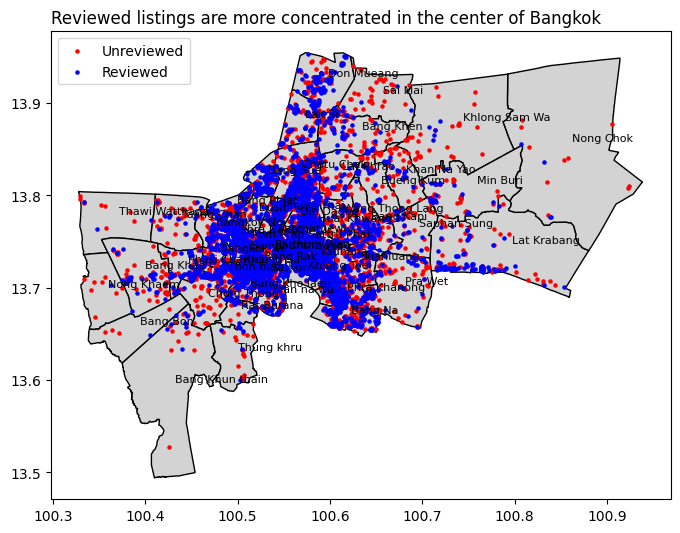

In [58]:
# read the Bangkok boundary GeoJSON file into a GeoDataFrame
bangkok_boundary = gpd.read_file('../data/bangkok-districts.geojson')

# create GeoDataFrame for reviewed listings
reviewed_filter = df['review_status'] == 'reviewed'
reviewed_longitude = df[reviewed_filter].longitude
reviewed_latitude = df[reviewed_filter].latitude
reviewed_geometry = gpd.points_from_xy(reviewed_longitude, reviewed_latitude)
reviewed_gdf = gpd.GeoDataFrame(df[reviewed_filter], geometry=reviewed_geometry)

# create GeoDataFrame for unreviewed listings
unreviewed_filter = df['review_status'] == 'no reviews'
unreviewed_longitude = df[unreviewed_filter].longitude
unreviewed_latitude = df[unreviewed_filter].latitude
unreviewed_geometry = gpd.points_from_xy(unreviewed_longitude, unreviewed_latitude)
unreviewed_gdf = gpd.GeoDataFrame(df[unreviewed_filter], geometry=unreviewed_geometry)

# plot Bangkok boundary
ax = bangkok_boundary.plot(color='#D3D3D3', edgecolor='black', figsize=(8, 8))

# plot reviewed and unreviewed listings
unreviewed_gdf.plot(ax=ax, color='red', markersize=5, label='Unreviewed')
reviewed_gdf.plot(ax=ax, color='blue', markersize=5, label='Reviewed')

# add geographical names as labels
for idx, row in bangkok_boundary.iterrows():
    ax.annotate(text=row['dname_e'], xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                xytext=(3, 3), textcoords='offset points', fontsize=8)

# setup legend
plt.legend(loc='upper left')

# add title
plt.title('Reviewed listings are more concentrated in the center of Bangkok',loc = 'left')
# plt.suptitle('Geospatial distributions for reviewed and unreviwed listings')

# show the plot
plt.show()

<b>Comment</b>: 
- Even though both reviewed and non-reviewed listings are scattered across inner and middle zones of Bangkok (see [[1]](https://doi.org/10.3390/su132011426) for the categorization of areas), the reviewed listings appear to be more densely clustered in the center of Bangkok compared to the unreviewed ones.
- To confirm this, we will investigate further by grouping areas.

In [85]:
# cheate function to group areas
def check_area(area):
    if area in ['Chatu Chak','Bang Sue','Dusit','Bang Rak','Bangkok Noi','Bangkok Yai','Khlong Toei',
                'Ratchathewi','Parthum Wan','Pom Prap Sattru Phai','Phra Nakhon','Phaya Thai','Huai Khwang',
                'Din Daeng','Sathon','Khlong San','Thon buri','Bang Kho laen','Yan na wa','Samphanthawong','Vadhana']:
        return 'Inner Zone'
    elif area in['Sai Mai','Bang Kapi','Lat Phrao','Bang Khen','Bueng Kum','Chom Thong','Bang Na','Pra Wet',
                 'Suanluang','Saphan Sung','Khan Na Yao','Wang Thong Lang','Thung khru','Bang Khae','Bang Phlat',
                 'Phra Khanong','Rat Burana','Phasi Charoen']:
        return 'Middle Zone'
    elif area in['Nong Chok','Lat Krabang','Min Buri','Khlong Sam Wa','Taling Chan','Lak Si','Don Mueang',
                 'Bang Khun thain','Bang Bon','Nong Khaem','Thawi Watthana']:
        return 'Outer Zone'
    else :
        return 'Unknown'

# apply function to group areas
df['city_zone'] = df['neighbourhood'].apply(check_area)

# count listings based on grouped areas
listing_areas = (df.groupby(['review_status', 'city_zone'])
                 .agg(func={'id':'count'})
                 .rename(columns={'id':'count'}).reset_index())

# add percentage
listing_areas['percentage'] = (listing_areas['count']/sum(listing_areas['count'])*100).round(2)

# display result
listing_areas

,review_status,city_zone,count,percentage
0,no reviews,Inner Zone,4078,25.72
1,no reviews,Middle Zone,1378,8.69
2,no reviews,Outer Zone,333,2.10
3,reviewed,Inner Zone,8233,51.93
4,reviewed,Middle Zone,1517,9.57
5,reviewed,Outer Zone,314,1.98


In [100]:
# set color
color_scale = alt.Scale(
    domain=['no reviews', 'reviewed'],
    range=['#026f7c', '#69c1cb']
)

alt.Chart(listing_areas).mark_bar().encode(
    alt.X('review_status', title='Review Status', sort='-y', axis=alt.Axis(labelAngle=0)), 
    alt.Y('percentage', title='Count of Listings (%)'),
    color=alt.Color("review_status").scale(color_scale).legend(None),
    tooltip=['review_status', 'city_zone', 'count', 'percentage'],
    column=alt.Column('city_zone', title=None)
).properties(
    title=alt.Title('Reviewed listings have higher concentration in the inner zone of Bangkok',
    subtitle='Comparison based on city zones',
    subtitleFontSize=16,
    subtitleColor='grey',
    fontSize=18,
    offset=15,
    anchor='start'),
    height=300, 
    width=350
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
).configure_header(
    labelFontSize=14,
    labelFontWeight='bold'
)

alt.Chart(...)

<b>Comment</b>
- The bar chart above confirms that the reviewed listing is more concentrated in the inner zone, higher than the unreviewed ones.
- To understand more about the reviewed listings, we can take a look at the distributin of highly reviewed listings across Bangkok. And to simplify the map (for better readability), top-50 most reviewed listings will be visualized.

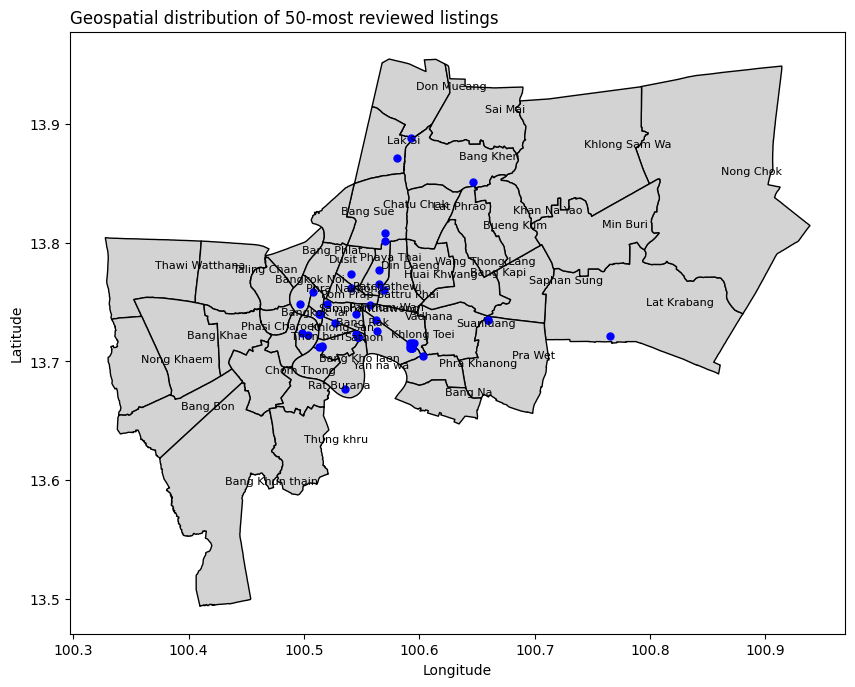

In [59]:
# get the top 50 most reviewed listings
top50_listings = (df.nlargest(50, 'number_of_reviews')
                  [['id', 'name', 'number_of_reviews', 'latitude', 'longitude']])

# load bangkok district boundaries
bangkok_boundary = gpd.read_file('../data/bangkok-districts.geojson')

# create the plot
fig, ax = plt.subplots(figsize=(10, 8))

# plot the Bangkok district boundaries
bangkok_boundary.plot(ax=ax, color='#D3D3D3', edgecolor='black')

# add markers for each top 50 listing
for idx, row in top50_listings.iterrows():
    ax.plot(row['longitude'], row['latitude'], marker='o', color='blue', markersize=5)

# add geographical names as labels
for idx, row in bangkok_boundary.iterrows():
    ax.annotate(text=row['dname_e'], xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                xytext=(3, 3), textcoords='offset points', fontsize=8)

# set title and labels
plt.title('Geospatial distribution of 50-most reviewed listings', loc='left')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# show the plot
plt.show()


<b>Comment</b>
- While there are also some listings scattered outside the center of Bangkok, the most frequently reviewed listings are mostly located inside the inner circle of Bangkok.
- This finding indicates that the listings in the center of the capital city of Thailand are mostly preferred and booked.
- But it is unclear yet why this finding is as it is. To gain a deeper understanding of this finding, we need to drill down the data further.

In [60]:
# get top neighbourhoods based on number of reviews
top_neighbourhoods = (df.groupby('neighbourhood', as_index=False)
                      .agg(func={'number_of_reviews':'sum'})
                      .nlargest(columns='number_of_reviews', n=10))

# create a base chart (circle)
chart = alt.Chart(top_neighbourhoods).mark_point(size=300).encode(
    y=alt.Y('neighbourhood:N', title='Neighbourhood', sort='-x'),
    x=alt.X('number_of_reviews:Q', title='Number of Reviews'),
    fill=alt.condition(
        alt.FieldOneOfPredicate(field='neighbourhood', oneOf=['Khlong Toei', 'Vadhana']),
        alt.value('#163E93'),
        alt.value('#69c1cb')
    ),
    color=alt.condition(
        alt.FieldOneOfPredicate(field='neighbourhood', oneOf=['Khlong Toei', 'Vadhana']),
        alt.value('#163E93'),
        alt.value('#69c1cb')
    )
)

# add line to the base chart
line = chart.mark_rule(color='gray', strokeDash=[10, 5]).encode(
    x=alt.X('number_of_reviews')
)

# add text annotation
text = chart.mark_text(
    align='left',
    baseline='middle',
    dx=15,
    dy=0,
    color='black'
).encode(
    text=alt.Text('number_of_reviews', format='.3s')
)

# combine all elements
(chart + line + text).properties(
    title=alt.Title('Khlong Toei and Vadhana are the 2-most reviewed neighbours',
                    subtitle='Top-10 neighbourhoods with highest number of reviews',
                    anchor='start',
                    fontSize=18,
                    subtitleFontSize=16,
                    subtitleColor='grey',
                    offset=15),
    height=350, width=600
).configure_axis(
    labelFontSize=12,
    titleFontSize=14,
)

alt.LayerChart(...)

<b>Comment</b>
- Listings around Khlong Toei and Vadhana received most substantial numbers of reviews (41.3 vs 37.4 thousands) between 2012 and 2022, indicating the potential presence of tourist attractions in or around these places.
- These numbers of reviews are far greater than the other listings, emphasizing something more special in or around these two areas.
- [Khlong Toei](https://en.wikipedia.org/wiki/Khlong_Toei_district) and [Vadhana](https://en.wikipedia.org/wiki/Watthana_district) are fast-developing areas for public facilities (e.g., shopping and entertainment spots, hospitals, public transports, embassies) in the center of Bangkok.

<div class="alert alert-block alert-success">
<b>Takeaway Message:</b><br>

- Unlike the unreviewe listings, the reviewed ones are typically <span style='color:red'>concentrated in the center of Bangkok</span>, and close to areas with more public facilities such as Khlong Toei and Vadhana.
</div>

#### <b>Q6. Do unreviewed listings have different patterns in listing naming?</b>

In [61]:
# split df based on review_status
reviewed_listings = df[df['review_status'] == 'reviewed']
unreviewed_listings = df[df['review_status'] == 'no reviews']

# function for text cleaning
def clean_text(text): 
    # remove punctuation
    text = re.sub(r'[^\w\s]', '', text)
    # remove numbers
    text = re.sub(r'\d+', '', text)
    # convert text to lowercase and tokenize words
    words = word_tokenize(text.lower())
    # remove stopwords
    stop_words = set(stopwords.words('english'))
    # store to words if not stop words
    words = [word for word in words if word not in stop_words]
    # get frequency of words
    word_counts = Counter(words)
    return word_counts

# apply function to name column based on review_status
word_counts_reviewed = (df[df['review_status'] == 'reviewed']['name']
                        .apply(clean_text)
                        .sum())
word_counts_unreviewed = (df[df['review_status'] == 'no reviews']['name']
                          .apply(clean_text)
                          .sum()
)

# create dfs from word counts
df_reviewed = pd.DataFrame.from_dict(word_counts_reviewed, 
                                     orient='index', 
                                     columns=['reviewed'])
df_unreviewed = pd.DataFrame.from_dict(word_counts_unreviewed, 
                                       orient='index', 
                                       columns=['unreviewed'])

# concat dfs
word_counts_df = pd.concat([df_reviewed, 
                            df_unreviewed], 
                            axis=1, 
                            sort=True).fillna(0)

# add row-wise total
word_counts_df['rowwise_total'] = word_counts_df['reviewed'] + word_counts_df['unreviewed'] 

# sort df
word_counts_df = (word_counts_df
                  .reset_index(names='word')
                  .sort_values(by='rowwise_total', ascending=False))

# display result
word_counts_df.head(10)

,word,reviewed,unreviewed,rowwise_total
1145,bts,2116.0,592.0,2708.0
6063,room,1455.0,1014.0,2469.0
4583,near,1312.0,528.0,1840.0
481,bangkok,857.0,496.0,1353.0
957,br,985.0,241.0,1226.0
1797,condo,712.0,433.0,1145.0
4352,mrt,692.0,276.0,968.0
7011,sukhumvit,652.0,303.0,955.0
711,bedroom,513.0,392.0,905.0
1938,cozy,637.0,237.0,874.0


<b>Comment</b>
- Before doing the text analysis, it is important to convert the raw frequency to the normalized (relative) frequency first. It is because as shown in the beginning of Section 4, the number of reviewed and unreviewed listings are inequal. It will be misleading to compare the frequencies to investigate the listing difference since if the number of listings are different, then the total number of words will also be different.
- To make them directly comparable, we need to convert the raw frequencies into normalized ones.

In [62]:
# add normalized freq for comparison purposes
word_counts_df['norm_reviewed'] = (word_counts_df['reviewed']/
                                   sum(word_counts_df['reviewed'])*1000).round(2)
word_counts_df['norm_unreviewed'] = (word_counts_df['unreviewed']/
                                     sum(word_counts_df['unreviewed'])*1000).round(2)
word_counts_df['norm_diff'] = word_counts_df['norm_reviewed'] - word_counts_df['norm_unreviewed']
word_counts_df['norm_total'] = (word_counts_df['rowwise_total']/
                                sum(word_counts_df['rowwise_total'])*1000).round(2)

# display result
word_counts_df.head(10)

,word,reviewed,unreviewed,rowwise_total,norm_reviewed,norm_unreviewed,norm_diff,norm_total
1145,bts,2116.0,592.0,2708.0,41.32,24.02,17.30,35.69
6063,room,1455.0,1014.0,2469.0,28.41,41.13,-12.72,32.54
4583,near,1312.0,528.0,1840.0,25.62,21.42,4.20,24.25
481,bangkok,857.0,496.0,1353.0,16.73,20.12,-3.39,17.83
957,br,985.0,241.0,1226.0,19.23,9.78,9.45,16.16
1797,condo,712.0,433.0,1145.0,13.90,17.57,-3.67,15.09
4352,mrt,692.0,276.0,968.0,13.51,11.20,2.31,12.76
7011,sukhumvit,652.0,303.0,955.0,12.73,12.29,0.44,12.59
711,bedroom,513.0,392.0,905.0,10.02,15.90,-5.88,11.93
1938,cozy,637.0,237.0,874.0,12.44,9.61,2.83,11.52


In [72]:
# export dataset for external analysis
word_counts_df.to_csv('../data/word_counts.csv', index=False)

In [75]:
# reviewed listings: base chart for most common words
word_reviewed = alt.Chart(word_counts_df.head(10)).mark_bar(color='#69c1cb').encode(
    x=alt.X('norm_reviewed', title='Relative Frequency'),
    y=alt.Y('word', sort='-x'),
    color=alt.condition(
        alt.FieldOneOfPredicate(field='word', oneOf=['bts', 'mrt']),
        alt.value('orange'),
        alt.value('#69c1cb'))
).properties(
    title=alt.Title('Reviewed listings',
    anchor='start',
    fontSize=15,
    fontWeight='normal'),
    width=450, height=300
)

# reviewed listings: add labeel
word_reviewed_text = word_reviewed.mark_text(
    align='center',
    baseline='middle',
    dy=0,
    dx=15,  
    color="black",
    fontSize=12
).encode(
    text=alt.Text("norm_reviewed")
)

# unreviewed listings: chart for most common words
word_unreviewed = alt.Chart(word_counts_df.head(10)).mark_bar(color='#026f7c').encode(
    x=alt.X('norm_unreviewed', title='Relative Frequency'),
    y=alt.Y('word', sort='-x'),
      color=alt.condition(
        alt.FieldOneOfPredicate(field='word', oneOf=['condo', 'bedroom']),
        alt.value('orange'),
        alt.value('#026f7c'))
).properties(
    title=alt.Title('Unreviewed listings',
    anchor='start',
    fontSize=15,
    fontWeight='normal'),
    width=450, height=300
)
# reviewed listings: add labels
word_unreviewed_text = word_unreviewed.mark_text(
    align='center',
    baseline='middle',
    dy=0,
    dx=15,  
    color="black",
    fontSize=12
).encode(
    text=alt.Text("norm_unreviewed")
)

# concat plots
(word_reviewed + word_reviewed_text | word_unreviewed + word_unreviewed_text).properties(
    title=alt.Title('Reviewed listings prioritize proximity to transportation while unreviewed ones focus more on accommodation features',
                    subtitle='Comparison based on most frequeent words in listing name',
                    subtitleColor='grey',
                    subtitleFontSize=16,
                    anchor='start',
                    fontSize=18,
                    offset=15)
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.HConcatChart(...)

<b>Comment</b>
- Reviewed listings often highlight their proximity to transportation hubs like BTS and MRT, indicating a focus on convenience for guests, as seen with higher normalized frequencies (41.32% and 13.51% respectively). Conversely, unreviewed listings emphasize both condominiums ("condo") and bedrooms (17.57 and 15.90), possibly suggesting a focus on accommodation size and amenities over location convenience.
- Since this current finding is in line with the result in Q5, this insight underscores different guest preference when looking for an accommodation. 

<div class="alert alert-block alert-success">
<b>Takeaway Message:</b><br>

- Reviewed listings commonly feature their <span style='color:red'>closeness to transportation hubs</span> while unreviewed listings tend to <span style='color:red'>focus on amenities</span>, suggesting divergent guest preferences.
</div>

#### <b>Q7. How is the trend of reviews over time (years and months)?</b>

In [65]:
# filter out listings without any reviews
reviews_per_neighbourhood_year = (df.dropna(subset=['last_review'])
                                  .groupby(['review_status', 'neighbourhood', 'last_review_year'])
                                  .agg(func={'number_of_reviews':'sum'})
                                  .reset_index())

# get list of top neighbourhoods
top_neighbourhood_list = (reviews_per_neighbourhood_year
                          .groupby('neighbourhood')
                          .agg(func={'number_of_reviews':'sum'})
                          .nlargest(columns='number_of_reviews', n=10)
                          .index)

# get data based on top neighbouthood list
top_neighbourhoods_data = (reviews_per_neighbourhood_year[reviews_per_neighbourhood_year['neighbourhood']
                                                          .isin(top_neighbourhood_list)])

# calculate total number of reviews per neighbourhood for sorting purposes
total_reviews_per_neighbourhood = (top_neighbourhoods_data.groupby('neighbourhood')
                                   .agg(func={'number_of_reviews':'sum'})
                                   .reset_index()
                                   .rename(columns={'number_of_reviews': 'total_reviews'}))

# merge this back into the original df for use
top_neighbourhoods_data = (top_neighbourhoods_data
                           .merge(total_reviews_per_neighbourhood, on='neighbourhood', how='left'))

# sample data to check results
top_neighbourhoods_data.sample(10, random_state=42)

,review_status,neighbourhood,last_review_year,number_of_reviews,total_reviews
78,reviewed,Vadhana,2016,67,37415
0,reviewed,Bang Rak,2014,7,17654
68,reviewed,Sathon,2015,4,22242
22,reviewed,Huai Khwang,2020,4752,18145
12,reviewed,Chatu Chak,2018,203,8218
82,reviewed,Vadhana,2020,2333,37415
10,reviewed,Chatu Chak,2016,37,8218
18,reviewed,Huai Khwang,2016,73,18145
4,reviewed,Bang Rak,2018,206,17654
66,reviewed,Ratchathewi,2022,17389,20698


In [66]:
# create base chart
heatmap = alt.Chart(top_neighbourhoods_data).mark_rect().encode(
    x=alt.X('last_review_year:O', 
            title='Year', 
            axis=alt.Axis(labelAngle=0)),
    y=alt.Y('neighbourhood:N', 
            title='Neighbourhood', 
            sort=alt.EncodingSortField(field='total_reviews', order='descending')),
    color=alt.Color('number_of_reviews:Q', 
                    legend=None,
                    title='Number of Reviews', 
                    scale=alt.Scale(scheme='blues')),
    tooltip=[alt.Tooltip('neighbourhood:N', title='Neighbourhood'), 
             alt.Tooltip('last_review_year:O', title='Year'), 
             alt.Tooltip('number_of_reviews:Q', title='Number of Reviews')]
).properties(
    width=500,
    height=300
)

# add text labels
text = alt.Chart(top_neighbourhoods_data).mark_text(
    align='center',
    baseline='middle'
).encode(
    x=alt.X('last_review_year:O'),
    y=alt.Y('neighbourhood:N', 
            sort=alt.EncodingSortField(field='total_reviews', order='descending')),
    text=alt.Text('number_of_reviews:Q'),
    color=alt.condition(
        alt.datum.number_of_reviews > 10000,  
        alt.value('white'),
        alt.value('black')
        )
)

# combine text and heatmap
(heatmap + text).properties(
    title=alt.Title('Review number of listings near Khlong Toei & Vadhana rose substantially',
                    subtitle='Trend of reviews by top-10 neighbourhoods over years',
                    anchor='start',
                    fontSize=18,
                    subtitleFontSize=16,
                    subtitleColor='grey',
                    offset=15)
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.LayerChart(...)

<b>Comment</b>
- Because COVID-19 pandemic in Thailand, particularly in Bangkok, a fluctuation of review number in all top-10 listings based on neighbourhoods can be seen between 2019 (the emergence of COVID-19) and 2021 (social restrictions in Thailand). 
- In addition to this general pattern, as can be seen on the heatmap, there are two listings, namely Khlong Toei and Vadhana, whose review numbers experienced significant growth in 2022. This significant rise may indicate the tourism industry in Bangkok got better after the COVID-19 pandemic. Although it might not provide a definitive explanation, this finding also implies that Airbnb listings closer to Khlong Toei and Vadhana were mostly visited in Bangkok, and possibly they are close to many tourist attractions. 
- To understand more about the development in the review numbers, we need to analyze the number of reviews in more details by checking the trend of reviews across months in 2021 and 2022. 

In [67]:
# filter specific information
reviewed_2021 = (df[df['last_review'].dt.year == 2021]
                 .loc[:, ['review_status', 'neighbourhood', 'last_review', 'number_of_reviews']])

# extract month from last_review
reviewed_2021['last_review_month'] = reviewed_2021['last_review'].dt.month

# drop columns after not needed
reviewed_2021.drop(columns=['review_status', 'last_review'], inplace=True)

# filter neighbourhood
reviewed_2021 = reviewed_2021[reviewed_2021['neighbourhood'].isin(top_neighbourhood_list)]

# sum up the number_of_reviews
reviewed_2021 = (reviewed_2021.groupby(['neighbourhood', 'last_review_month'])
                 .agg(func={'number_of_reviews':'sum'})
                 .reset_index())

In [68]:
# create base chart
heatmap_base_2021 = alt.Chart(reviewed_2021).mark_rect().encode(
    x=alt.X('last_review_month:O', 
            title='Month in 2021', 
            axis=alt.Axis(labelAngle=0)),
    y=alt.Y('neighbourhood:N', 
            title='Neighbourhood', 
            sort=alt.EncodingSortField(field='number_of_reviews', order='descending')),
    color=alt.Color('number_of_reviews:Q', 
                    legend=None,
                    title='Number of Reviews', 
                    scale=alt.Scale(scheme='blues')),
    tooltip=[alt.Tooltip('neighbourhood:N', title='Neighbourhood'), 
             alt.Tooltip('last_review_month:O', title='Month'), 
             alt.Tooltip('number_of_reviews:Q', title='Number of Reviews')]
).properties(
    width=500,
    height=300
)

# add text labels
text_2021 = alt.Chart(reviewed_2021).mark_text(
    align='center',
    baseline='middle'
).encode(
    x=alt.X('last_review_month:O'),
    y=alt.Y('neighbourhood:N', 
            sort=alt.EncodingSortField(field='number_of_reviews', order='descending')),
    text=alt.Text('number_of_reviews:Q'),
    color=alt.condition(
        alt.datum.number_of_reviews > 10000,  
        alt.value('white'),
        alt.value('black')
        )
)

# combine text and heatmap
year2021 = (heatmap_base_2021 + text_2021).properties(
    title=alt.Title('Only listings around Khlong Toei rented througout 2021',
                    fontWeight='normal',
                    anchor='start',
                    fontSize=16,
                    offset=15)
)

In [69]:
# filter specific ionformation
reviewed_2022 = (df[df['last_review'].dt.year == 2022]
                 .loc[:, ['review_status', 'neighbourhood', 'last_review', 'number_of_reviews']])

# extract month from last_review
reviewed_2022['last_review_month'] = reviewed_2022['last_review'].dt.month

# drop columns after not needed
reviewed_2022.drop(columns=['review_status', 'last_review'], inplace=True)

# filter neighbourhood
reviewed_2022 = reviewed_2022[reviewed_2022['neighbourhood'].isin(top_neighbourhood_list)]

# sum up the number_of_reviews
reviewed_2022 = (reviewed_2022.groupby(['neighbourhood', 'last_review_month'])
                 .agg(func={'number_of_reviews':'sum'})
                 .reset_index())

In [70]:
# create base chart
heatmap_base_2022 = alt.Chart(reviewed_2022).mark_rect().encode(
    x=alt.X('last_review_month:O', 
            title='Month in 2022', 
            axis=alt.Axis(labelAngle=0)),
    y=alt.Y('neighbourhood:N', 
            title='Neighbourhood', 
            sort=alt.EncodingSortField(field='number_of_reviews', order='descending')),
    color=alt.Color('number_of_reviews:Q', 
                    legend=None,
                    title='Number of Reviews', 
                    scale=alt.Scale(scheme='blues')),
    tooltip=[alt.Tooltip('neighbourhood:N', title='Neighbourhood'), 
             alt.Tooltip('last_review_month:O', title='Month'), 
             alt.Tooltip('number_of_reviews:Q', title='Number of Reviews')]
).properties(
    width=500,
    height=300
)

# add text labels
text_2022 = alt.Chart(reviewed_2022).mark_text(
    align='center',
    baseline='middle'
).encode(
    x=alt.X('last_review_month:O'),
    y=alt.Y('neighbourhood:N', 
            sort=alt.EncodingSortField(field='number_of_reviews', order='descending')),
    text=alt.Text('number_of_reviews:Q'),
    color=alt.condition(
        alt.datum.number_of_reviews > 10000,  
        alt.value('white'),
        alt.value('black')
        )
)

# combine text and heatmap
year2022 = (heatmap_base_2022 + text_2022).properties(
    title=alt.Title('Number of reviews in general increased in Q4 2022',
                    fontWeight='normal',
                    anchor='start',
                    fontSize=16,
                    offset=15)
)

In [71]:
# combine heatmap 2021 and 2022
(year2021 | year2022).properties(
    title=alt.Title('Despite fluctuations in 2021, the number of reviews significantly grew in the following year',
                    subtitle ='Trend of reviews by top-10 neighbourhoods over months in 2021 and 2022',
                    subtitleFontSize=16,
                    subtitleColor='grey',
                    fontSize=18,
                    anchor='start',
                    offset=15)
).configure_axis(
    labelFontSize=12,
    titleFontSize=14
)

alt.HConcatChart(...)

<b>Comment</b>
- These two heatmaps summarize the trend of review numbers in Airbnb Bangkok listings between 2021 and 2022.
- Let's discuss the heatmap for 2021 data first. From this chart, we can see there are empty data (cells in white, e.g., in Mar 2021 for Bang Rak) in several months in 2021. This might reflect the social restictions enacted by the government in a large scale due to COVID-19 pandemic [[2](https://www.thaipbsworld.com/what-does-new-level-4-alert-mean-for-thailand/)] since the first month of 2021 so that the listings with certain neighbourhoods were not booked and did not receive any reviews from guests.
- However, in 2022, particularly after the government lift the nation-wide social restrictions [[3](https://www.tatnews.org/2022/06/thailand-lifts-nationwide-covid-19-restrictions-with-immediate-effect/)], the development in the review number can be seen better. After the end of the nation-wide social restriction, the number of reviews grew substantially in all listings although in some locations.
- The fact that some areas prior to Jun 2022 remains empty can be best attributed to the social restriction lifting was enacted in Jun 23th, 2024.

<div class="alert alert-block alert-success">
<b>Takeaway Message:</b><br>

- The number of reviews by neighbourhoods <span style='color:red'>increased over time</span>, particularly after the social restriction lift by the officials, in the middle of 2022.

- Among those listings, those which are closer to <span style='color:red'>Khlong Toei and Vedhana</span> received the most significant number of reviews, possibly due to closer proximity to tourist attractions or public facilities in Bangkok.
</div>

## <b>5 Conclusions</b>
<b>Summary</b>: In brief, this analysis  seeks to address the lack of review issue on Airbnb platform by comparing reviewed and unreviewed listings based on different variables such as pricing, property types, listing availability throughout the year, locations, minimum stay requirement, and neigbourhood. The main findings of this comparative analysis can be summed up into the following points.
- Unreviewed listings tend to command higher prices compared to reviewed ones, suggesting a possible deterrent for potential guests to rent and leave reviews.
- While both reviewed and unreviewed listings have similar minimum stay requirements in general, a closer examination reveals that unreviewed listings, particularly for shared rooms, impose a minimum stay of at least 90 days, whereas reviewed listings allow guests to book for as little as one night.
- Reviewed listings predominantly offer entire homes or apartments, which may represent better value for guests seeking privacy and space, whereas unreviewed listings are mainly private rooms. The additional space and privacy can be more appealing to guests leading them to choose entire home or apartment over the private rooms. 
- Reviewed listings generally experience lower median availability days, indicating a higher rate of bookings compared to unreviewed listings.
- Unlike unreviewed listings, reviewed ones are concentrated in central Bangkok, particularly in areas with ample public facilities such as those in Khlong Toei and Vadhana.
- Unreviewed listings emphasize listing features whereas reviewed listings commonly put nearest public facilities in their names.

In addition to these findings of the comparative approach, a further analysis on the reviewed listings also provide these following insights:
- The number of reviews across neighborhoods has shown an upward trend over time, particularly after the easing of social restrictions in mid-2022.
- Listings closer to Khlong Toei and Vadhana have received a significantly higher number of reviews, possibly due to their proximity to popular tourist attractions or essential amenities in Bangkok.

Taken altogether, factors such as pricing, minimum stay requirements, type of accommodation, availability, location, descriptive name, and neighborhood trends could contribute to the lack of reviews for certain listings in Bangkok.

<b>Recommendations</b>: Based on the  key findings listed, below are some actionable recommendations that can be offered to the Host Engagement Manager so that s/he could report to the hosts of the unreviewed listings. 
- Price adjustment of the unreviewed listings can be considered to make them more competitive with the reviewed ones. 
- Review and potentially revise minimum stay requirements for unreviewed listings, especially for shared rooms. Offering shorter minimum requirement may attract more guests to book and leave more reviews.
- Launch promotional campaigns to incentivize guests to book unreviewed listings. For example, hosts can offer bonus amenities for guests who book and leave a review.
- Focus marketing efforts on unreviewed listings in less central neighbourhoods by highlighting nearby attractions, transportation options, and amenities to attract guests looking for unique expeerience outside the city center.

<b>Limitations</b>: While this analysis provides valuable insights into the factors influencing the lack of reviews for Airbnb listings in Bangkok, it is important to note that we have focused solely on the number of reviews and have not taken into account the content of these reviews or the rating scores. Incorporating these additional dimensions would offer a more comprehensive understanding of guests' experiences and preferences.

## <b>6 Appendix</b>
The analysis used Geopandas to visualize locations of the listings instead of Folium because the file size after executing the code was too big, making the code unable to store on GitHub repository. This section only documents an alternative option of performing an analysis on listing locations using Folium. 

#### <b>Folium map 1: Reviewed vs unreviewed listings</b>
```python
# data for bangkok borders
bangkok_geojson = r'../data/bangkok-districts.geojson'

# create a map centered around Bangkok
bangkok_map = folium.Map(location=[13.7563, 100.5018], 
               zoom_start=11, 
               tiles='cartodbpositron', 
               scrollWheelZoom=False, 
               zoom_control=True)

# add bangkok boundary
folium.GeoJson(bangkok_geojson, name='Bangkok Boundary').add_to(bangkok_map)

# add points to the map for nonpopular listings
for index, row in df.iterrows():
    if row['review_status'] != 'reviewed':
        color = '#grey'
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=5,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.3,  
            popup=row['name']
        ).add_to(bangkok_map)

# Add points to the map for popular listings
for index, row in df.iterrows():
    if row['review_status'] == 'reviewed':
        color = '#163E93'
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=5,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.5,  
            popup=row['name']
        ).add_to(bangkok_map)

title_html = """
             <h3 align="left" style="font-size:20px"><b>Reviewed listings are geographically more concentrated in the center of Bangkok</b></h3>
             <h4 align="left" style="font-size:16px; color:grey; font-weight:normal">Geographical distribution of listings in Bangkok by review statuses</h4>
             """
bangkok_map.get_root().html.add_child(folium.Element(title_html))

# display the map
bangkok_map
```

### <b>Folium map 2: 50-most reviewed listings in Bangkok</b>
```python
# get 10-most reviewed listings
top10_listings = df.loc[:, ['id', 'name', 'number_of_reviews', 'latitude', 'longitude']].nlargest(columns='number_of_reviews', n=50)

# data for bangkok borders
bangkok_geojson = r'../data/bangkok-districts.geojson'

# create a map centered around Bangkok
bangkok_map = folium.Map(location=[13.7563, 100.5018], 
               zoom_start=11, 
               tiles='cartodbpositron', 
               scrollWheelZoom=False, 
               zoom_control=True)

# add bangkok boundary
folium.GeoJson(bangkok_geojson, name='Bangkok Boundary').add_to(bangkok_map)

# Add markers for each listing
for index, row in top10_listings.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7,
        popup=f"{row['name']}<br>Number of Reviews: {row['number_of_reviews']}"
    ).add_to(bangkok_map)

title_html = """
             <h3 align="left" style="font-size:20px"><b>Geospatial distribution of 10-most reviewed listings</b></h3>
             <h4 align="left" style="font-size:16px; color:grey; font-weight:normal">Geospatial distribution of 10-most reviewed listings</h4>
             """
bangkok_map.get_root().html.add_child(folium.Element(title_html))

# Display the map
bangkok_map
```

<h1 style='text-align:center'>---End---</h1>

___

In [82]:
df.groupby(['review_status', 'city_zone']).agg(func={'id':'count'}).rename(columns={'id':'count'}).reset_index()

,review_status,city_zone,count
0,no reviews,Inner Zone,4078
1,no reviews,Middle Zone,1378
2,no reviews,Outer Zone,333
3,reviewed,Inner Zone,8233
4,reviewed,Middle Zone,1517
5,reviewed,Outer Zone,314
